# This is the notebook explaining the outputs and analysis of the Flint-inspired Agent-Based Model

The model has 6 versions:
- a parameter sweep on model without organizing and static trust
- a model that adds in organizing behavior to the simple version
- a model that adds dynamic trust to the organizing behavior
- the first simple model wtih media connections added
- a model that has static trust, media connections, and organizing behavior
- a model that has dynamic trust, media connections, and organizing behavior

In [1]:
#install packages

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import csv
import pandas as pd
import re
import array as arr
from scipy.stats import pearsonr

## Google trends data interpretation

[0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 3, 1, 1, 1, 1, 1, 1, 0, 0, 0, 4, 3, 2, 9, 23, 100, 57, 38, 27, 14, 12, 13, 19, 15, 9, 7, 7, 7, 11, 9, 9, 6, 5, 3, 3, 3, 3, 3, 3]


Text(0.5, 1.0, 'Google Trends Outputs')

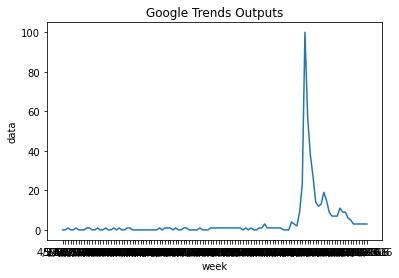

In [3]:
google_trends = pd.read_csv('google-trends.csv')
google_trends.columns = ['week', 'data']
google_data = google_trends['data'].to_list()
print(google_data)
sns.lineplot(data=google_trends, x='week', y='data')
plt.title('Google Trends Outputs')
#plt.show()

#peak-time = 91
#total-spread = unknown
#r = 1
#total error = 0 
#1-week = 77, time = 91
#2-week =91, time = 91
#3-week = 98, time = 91
#4-week = 97, time = 91
#5-week = 96, time = 91


## Model 1: influence model

### Task 1: Interpret outcomes from csv output 

In [3]:
#load in the csv file
infl_mod = pd.read_csv('static-influence-sweep.csv')
infl_mod.columns = ['run', 'n', 'spread-type', 'simple-spread-chance', 'graph-type', 'ba-m', 'citizen-media-influence',
                  'citizen-citizen-influence','repetition', 'data', 'num_media']


In [4]:
#process the csv and add columns to fill with metrics later

#short list represents both the shortened list to match the google trends data (114 weeks) and the processed data so that it
#is scaled out of 100 to better align with google data
infl_mod["short list"]=None
infl_mod['unscaled-list']=None
#threshold is a binary value representing whether or not the critical mass of the population has been reached (represented by
# 70%)
infl_mod['threshold'] = None
#peak-time is the time at which the peak will occur
infl_mod['peak-time']=None
#total spread is how many agents were reached in sum 
infl_mod['total-spread']=None
#n-week-spread is the largest increase in new agents over a n-week period
infl_mod['1-week-spread']=None
infl_mod['2-week-spread']=None
infl_mod['3-week-spread']=None
infl_mod['4-week-spread']=None
infl_mod['5-week-spread']=None
#total-error is the total error
infl_mod['total-error']=None
#r is caluclated as pearson's r
infl_mod['r']= None


'''The three functions below are needed for data processing'''

def convertdata(data):
    sdata = data.strip(' ')
    ndata = nlogo_parse_chunk(sdata)
    n2data = [elem.replace('.', '') for elem in ndata]
    list=[]
    for x in n2data:
        list.append(x.replace("\r\n", ""))
    list = [i for i in list if i]
    return list

def nlogo_parse_chunk(chunk):
    chunk = chunk.strip().replace('"','')
    if chunk.count('[') > 1 and chunk[0] == '[':
        return nlogo_mixed_list_to_dict_rec(chunk[chunk.index('['):].strip())
    elif chunk.count('[') > 1 or chunk[0] != '[':
        return { chunk[0:chunk.index('[')].strip(): nlogo_mixed_list_to_dict_rec(chunk[chunk.index('['):].strip()) }

    pieces = chunk.strip().replace('[','').replace(']','').split(' ')
    if len(pieces) == 2:
        return { pieces[0]: pieces[1] }
    else:
        return pieces

def convert_to_int(data):
    for i in range(0, len(data)):
        data[i] = int(data[i])
    return data



'''This section goes through each simulation to update the dataframe with usable data and the metrics set up above'''
for i in range(0,infl_mod.shape[0]):
    thresh=0
    error=0
    delta_max_1=0
    delta_max_2=0
    delta_max_3=0
    delta_max_4=0
    delta_max_5=0
    
    #set cutoff to the number of agents that need to hear about Flint to be considered a success- for this model, total runs are 
    #500 agents, so 350 represents 70% of them
    cutoff= (300 + int(infl_mod['num_media'].iloc[i])) * 0.7
    
    run1 = infl_mod["data"].iloc[i]
    finallist = convertdata(run1)
    int_data = convert_to_int(finallist)
    short_list=int_data[: 114]
    infl_mod['unscaled-list'].iloc[i] = short_list
    scaled_short_list=[]
        #code below scales data from 0-100 to match google trends- this is needed to calculate total error, pearson's r, etc
    if max(short_list)>= 1:
        for k in range(0, len(short_list)):
            val=(short_list[k]/max(short_list))*100
            scaled_short_list.append(val)
        time_of_peak=short_list.index(max(short_list))
    else:
        for k in range(0, len(short_list)):
            val = (short_list[k] / 1) * 100
            scaled_short_list.append(val)
    infl_mod['short list'].iloc[i] = scaled_short_list
    for h in range(0, len(scaled_short_list)):
        thresh=thresh+int_data[h]
        error_addition=abs(scaled_short_list[h]-google_data[h])
        error=error+error_addition
    #since thresh is untransformed, we tabulate off of raw data cut to 114 weeks, not the scaled 0-100 data
    infl_mod['total-spread'].iloc[i] = thresh
    if thresh >= cutoff:
        infl_mod['threshold'].iloc[i] = 1
    else:
        infl_mod['threshold'].iloc[i] = 0
    for a in range(1, len(scaled_short_list)):
        delta_1 = scaled_short_list[a] - scaled_short_list[a-1]
        if delta_1 > delta_max_1:
            delta_max_1 = delta_1
        else:
            pass
    for j in range(2, len(scaled_short_list)):
        delta_2 = scaled_short_list[j] - scaled_short_list[j-2]
        if delta_2 > delta_max_2:
            delta_max_2 = delta_2
        else:
            pass
    for b in range(3, len(scaled_short_list)):
        delta_3 = scaled_short_list[b] - scaled_short_list[b-3]
        if delta_3 > delta_max_3:
            delta_max_3 = delta_3
        else:
            pass
    for c in range(4, len(scaled_short_list)):
        delta_4 = scaled_short_list[c] - scaled_short_list[c-4]
        if delta_4 > delta_max_4:
            delta_max_4 = delta_4
        else:
            pass
    for d in range(5, len(scaled_short_list)):
        delta_5 = scaled_short_list[d] - scaled_short_list[d-5]
        if delta_5 > delta_max_5:
            delta_max_5 = delta_5
        else:
            pass
    
    
    corr_coef=pearsonr(google_data,scaled_short_list)
    corr_val=corr_coef[0]
    infl_mod['r'].iloc[i] = corr_val
    infl_mod["total-error"].iloc[i]=error
    infl_mod['peak-time'].iloc[i]=time_of_peak
    infl_mod['1-week-spread'].iloc[i] = delta_max_1
    infl_mod['2-week-spread'].iloc[i] = delta_max_2
    infl_mod['3-week-spread'].iloc[i] = delta_max_3
    infl_mod['4-week-spread'].iloc[i] = delta_max_4
    infl_mod['5-week-spread'].iloc[i] = delta_max_5
        #2-week spread
        
    if i % 5000 == 0:
        print(i)

infl_mod.to_csv('influence_mod_with_metrics.csv')


 

     

C:\Users\cknox02\Anaconda3\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
C:\Users\cknox02\Anaconda3\lib\site-packages\scipy\stats\stats.py:4023: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())


0


KeyboardInterrupt: 

## Task 2: Analysis
Now that our metrics have been calculated, we will use the next section to explore the outcomes....



Question 1: How do the parameters and metrics vary across the total runs?

In [1]:
'''WHAT ARE THE RANGES OF EACH OF OUR METRICS?'''
#Note: this analysis uses all simulations, not limited to those that crossed the threshold. Because of this, there bin for peak
#spread = 100 is inflated, because this includes runs that went something like [0,0,0,0,1,0,0,0]



figure, axis = plt.subplots(1, 4, figsize= (30,10))

# For peak time
axis[0].hist(infl_mod['peak-time'], bins=50)
axis[0].vlines(91, 0, 1200, color = 'red', label = 'google peak')
axis[0].set_title("Histogram of the time of Peak", size=20)
axis[0].legend()
axis[0].tick_params(axis='both', which='major', labelsize=22)
  
# For total-spread
axis[1].hist(infl_mod['total-spread'], bins=50)
axis[1].set_title("Histogram of the total spread", size=20)
axis[1].tick_params(axis='both', which='major', labelsize=22)

# For pearson's r
axis[2].hist(infl_mod['r'], bins=50)
axis[2].set_title("Histogram of Pearson's R", size=20)
axis[2].tick_params(axis='both', which='major', labelsize=22)

# For total error
axis[3].hist(infl_mod['total-error'], bins=50)
axis[3].set_title("Histogram of Total Error", size=20)
axis[3].tick_params(axis='both', which='major', labelsize=22)
  
# Combine all the operations and display

#figure, axis = plt.subplots(2, 3, figsize= (40,30))
plt.tick_params(axis='both', which='major', labelsize=22)
# For 1-week-spread
axis[0,0].hist(infl_mod['1-week-spread'], bins=50)
axis[0,0].set_title("1 Week Spread", size=20)
axis[0,0].tick_params(axis='both', which='major', labelsize=22)

# For 2-week-spread
axis[0,1].hist(infl_mod['2-week-spread'], bins=50)
axis[0,1].set_title("2 Week Spread", size=20)
axis[0,1].tick_params(axis='both', which='major', labelsize=22)

  
# For 3-week-spread
axis[0,2].hist(infl_mod['3-week-spread'], bins=50)
axis[0,2].set_title("3 Week Spread", size=20)
axis[0,2].tick_params(axis='both', which='major', labelsize=22)


# For 4-week-spread
axis[1,0].hist(infl_mod['4-week-spread'], bins=50)
axis[1,0].set_title("4 Week Spread", size=20)
axis[1,0].tick_params(axis='both', which='major', labelsize=22)

  
    
# For 5-week-spread
axis[1,1].hist(infl_mod['5-week-spread'], bins=50)
axis[1,1].set_title("5 Week Spread", size=20)
axis[1,1].tick_params(axis='both', which='major', labelsize=22)

NameError: name 'plt' is not defined

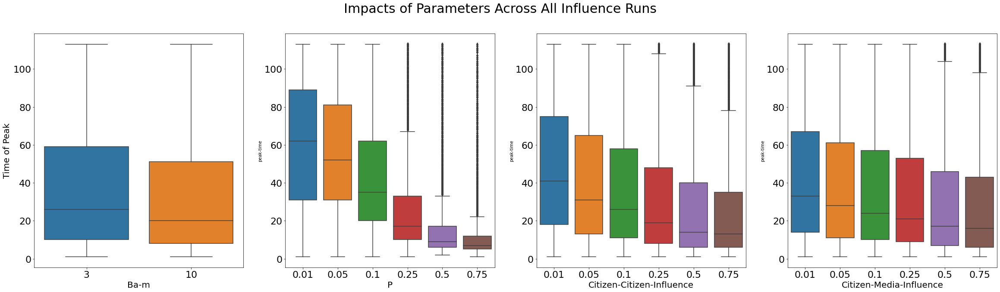

In [15]:
#Now we can explore how each parameter affected each metric
infl_mod = pd.read_csv("influence_mod_with_metrics.csv")
    
fig, axes=plt.subplots(1,4, figsize= (40,10))
fig.suptitle('Impacts of Parameters Across All Influence Runs', fontsize=30)

sns.boxplot(ax=axes[0], data= infl_mod, x='ba-m', y='peak-time')
axes[0].set_xlabel("Ba-m", fontsize=20)
axes[0].set_ylabel("Time of Peak", fontsize=20)
axes[0].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[1], data= infl_mod, x='simple-spread-chance', y='peak-time')
axes[1].set_xlabel("P", fontsize=20)
axes[1].tick_params(axis='both', which='major', labelsize=22)


sns.boxplot(ax=axes[2], data= infl_mod, x='citizen-citizen-influence', y='peak-time')
axes[2].set_xlabel("Citizen-Citizen-Influence", fontsize=20)
axes[2].tick_params(axis='both', which='major', labelsize=22)


sns.boxplot(ax=axes[3], data= infl_mod, x='citizen-media-influence', y='peak-time')
axes[3].set_xlabel("Citizen-Media-Influence", fontsize=20)
axes[3].tick_params(axis='both', which='major', labelsize=22)


plt.savefig("Boxplots_all_runs_infl.png")







Visually, we see that Ba-M has a strong impact really only on total information spread and a slight impact on time of peak. This makes sense because ba-m affects the intiial connectivity of the graph.

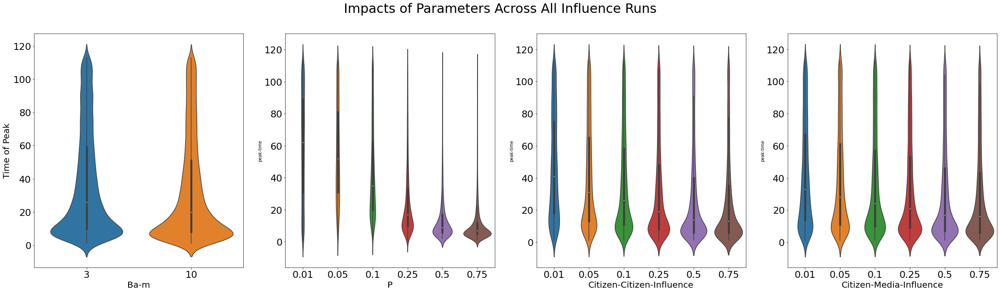

In [16]:
fig, axes=plt.subplots(1,4, figsize= (40,10))
fig.suptitle('Impacts of Parameters Across All Influence Runs', fontsize=30)

sns.violinplot(ax=axes[0], data= infl_mod, x='ba-m', y='peak-time')
axes[0].set_xlabel("Ba-m", fontsize=20)
axes[0].set_ylabel("Time of Peak", fontsize=20)
axes[0].tick_params(axis='both', which='major', labelsize=22)

sns.violinplot(ax=axes[1], data= infl_mod, x='simple-spread-chance', y='peak-time')
axes[1].set_xlabel("P", fontsize=20)
axes[1].tick_params(axis='both', which='major', labelsize=22)


sns.violinplot(ax=axes[2], data= infl_mod, x='citizen-citizen-influence', y='peak-time')
axes[2].set_xlabel("Citizen-Citizen-Influence", fontsize=20)
axes[2].tick_params(axis='both', which='major', labelsize=22)


sns.violinplot(ax=axes[3], data= infl_mod, x='citizen-media-influence', y='peak-time')
axes[3].set_xlabel("Citizen-Media-Influence", fontsize=20)
axes[3].tick_params(axis='both', which='major', labelsize=22)


plt.savefig("violinplots_all_runs_infl.png")





In [6]:

#simple-spread chance
#fig, axes=plt.subplots(3,3, figsize= (30,30))
fig.suptitle('Impacts of simple spread chance on Outcomes', fontsize=30)

sns.boxplot(ax=axes[0,0], data= infl_mod, x='simple-spread-chance', y='1-week-spread')
axes[0,0].set_xlabel("simple-spread-chance", fontsize=20)
axes[0,0].set_ylabel("1-weeks-spread", fontsize=20)
axes[0,0].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[0,1], data= infl_mod, x='simple-spread-chance', y='2-week-spread')
axes[0,1].set_xlabel("simple-spread-chance", fontsize=20)
axes[0,1].set_ylabel("2-weeks-spread", fontsize=20)
axes[0,1].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[0,2], data= infl_mod, x='simple-spread-chance', y='3-week-spread')
axes[0,2].set_xlabel("simple-spread-chance", fontsize=20)
axes[0,2].set_ylabel("3-weeks-spread", fontsize=20)
axes[0,2].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[1,0], data= infl_mod, x='simple-spread-chance', y='4-week-spread')
axes[1,0].set_xlabel("simple-spread-chance", fontsize=20)
axes[1,0].set_ylabel("4-weeks-spread", fontsize=20)
axes[1,0].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[1,1], data= infl_mod, x='simple-spread-chance', y='5-week-spread')
axes[1,1].set_xlabel("simple-spread-chance", fontsize=20)
axes[1,1].set_ylabel("5-weeks-spread", fontsize=20)
axes[1,1].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[1,2], data= infl_mod, x='simple-spread-chance', y='total-error')
axes[1,2].set_xlabel("simple-spread-chance", fontsize=20)
axes[1,2].set_ylabel("Total Error", fontsize=20)
axes[1,2].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[2,0], data= infl_mod, x='simple-spread-chance', y='r')
axes[2,0].set_xlabel("simple-spread-chance", fontsize=20)
axes[2,0].set_ylabel("Pearson's R", fontsize=20)
axes[2,0].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[2,1], data= infl_mod, x='simple-spread-chance', y='peak-time')
axes[2,1].set_xlabel("simple-spread-chance", fontsize=20)
axes[2,1].set_ylabel("Time of Peak", fontsize=20)
axes[2,1].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[2,2], data= infl_mod, x='simple-spread-chance', y='total-spread')
axes[2,2].set_xlabel("simple-spread-chance", fontsize=20)
axes[2,2].set_ylabel("Total Information Spread", fontsize=20)
axes[2,2].tick_params(axis='both', which='major', labelsize=22)

#citizen-citizen-influence


#citizen-media-influence



NameError: name 'fig' is not defined

Here, patterns are unclear in the x-week-spread (perhaps would flatten with a larger number of runs. However, there are significant impacts due to time of peak and total spread.

In [7]:
#citizen-citizen-influence
#fig, axes=plt.subplots(3,3, figsize= (30,30))
fig.suptitle('Impacts of citizen-citizen-influence on Outcomes', fontsize=30)

sns.boxplot(ax=axes[0,0], data= infl_mod, x='citizen-citizen-influence', y='1-week-spread')
axes[0,0].set_xlabel("citizen-citizen-influence", fontsize=20)
axes[0,0].set_ylabel("1-weeks-spread", fontsize=20)
axes[0,0].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[0,1], data= infl_mod, x='citizen-citizen-influence', y='2-week-spread')
axes[0,1].set_xlabel("citizen-citizen-influence", fontsize=20)
axes[0,1].set_ylabel("2-weeks-spread", fontsize=20)
axes[0,1].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[0,2], data= infl_mod, x='citizen-citizen-influence', y='3-week-spread')
axes[0,2].set_xlabel("citizen-citizen-influence", fontsize=20)
axes[0,2].set_ylabel("3-weeks-spread", fontsize=20)
axes[0,2].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[1,0], data= infl_mod, x='citizen-citizen-influence', y='4-week-spread')
axes[1,0].set_xlabel("citizen-citizen-influence", fontsize=20)
axes[1,0].set_ylabel("4-weeks-spread", fontsize=20)
axes[1,0].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[1,1], data= infl_mod, x='citizen-citizen-influence', y='5-week-spread')
axes[1,1].set_xlabel("citizen-citizen-influence", fontsize=20)
axes[1,1].set_ylabel("5-weeks-spread", fontsize=20)
axes[1,1].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[1,2], data= infl_mod, x='citizen-citizen-influence', y='total-error')
axes[1,2].set_xlabel("citizen-citizen-influence", fontsize=20)
axes[1,2].set_ylabel("Total Error", fontsize=20)
axes[1,2].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[2,0], data= infl_mod, x='citizen-citizen-influence', y='r')
axes[2,0].set_xlabel("citizen-citizen-influence", fontsize=20)
axes[2,0].set_ylabel("Pearson's R", fontsize=20)
axes[2,0].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[2,1], data= infl_mod, x='citizen-citizen-influence', y='peak-time')
axes[2,1].set_xlabel("citizen-citizen-influence", fontsize=20)
axes[2,1].set_ylabel("Time of Peak", fontsize=20)
axes[2,1].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[2,2], data= infl_mod, x='citizen-citizen-influence', y='total-spread')
axes[2,2].set_xlabel("citizen-citizen-influence", fontsize=20)
axes[2,2].set_ylabel("Total Information Spread", fontsize=20)
axes[2,2].tick_params(axis='both', which='major', labelsize=22)


NameError: name 'fig' is not defined

We see the biggest impact in total information spread, but this parameter also appears to affect spread in a discernable way.

In [8]:
#citizen-media-influence
#fig, axes=plt.subplots(3,3, figsize= (30,30))
fig.suptitle('Impacts of citizen-media-influence on Outcomes', fontsize=30)

sns.boxplot(ax=axes[0,0], data= infl_mod, x='citizen-media-influence', y='1-week-spread')
axes[0,0].set_xlabel("citizen-media-influence", fontsize=20)
axes[0,0].set_ylabel("1-weeks-spread", fontsize=20)
axes[0,0].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[0,1], data= infl_mod, x='citizen-media-influence', y='2-week-spread')
axes[0,1].set_xlabel("citizen-media-influence", fontsize=20)
axes[0,1].set_ylabel("2-weeks-spread", fontsize=20)
axes[0,1].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[0,2], data= infl_mod, x='citizen-media-influence', y='3-week-spread')
axes[0,2].set_xlabel("citizen-media-influence", fontsize=20)
axes[0,2].set_ylabel("3-weeks-spread", fontsize=20)
axes[0,2].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[1,0], data= infl_mod, x='citizen-media-influence', y='4-week-spread')
axes[1,0].set_xlabel("citizen-media-influence", fontsize=20)
axes[1,0].set_ylabel("4-weeks-spread", fontsize=20)
axes[1,0].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[1,1], data= infl_mod, x='citizen-media-influence', y='5-week-spread')
axes[1,1].set_xlabel("citizen-media-influence", fontsize=20)
axes[1,1].set_ylabel("5-weeks-spread", fontsize=20)
axes[1,1].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[1,2], data= infl_mod, x='citizen-media-influence', y='total-error')
axes[1,2].set_xlabel("citizen-media-influence", fontsize=20)
axes[1,2].set_ylabel("Total Error", fontsize=20)
axes[1,2].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[2,0], data= infl_mod, x='citizen-media-influence', y='r')
axes[2,0].set_xlabel("citizen-media-influence", fontsize=20)
axes[2,0].set_ylabel("Pearson's R", fontsize=20)
axes[2,0].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[2,1], data= infl_mod, x='citizen-media-influence', y='peak-time')
axes[2,1].set_xlabel("citizen-media-influence", fontsize=20)
axes[2,1].set_ylabel("Time of Peak", fontsize=20)
axes[2,1].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[2,2], data= infl_mod, x='citizen-media-influence', y='total-spread')
axes[2,2].set_xlabel("citizen-media-influence", fontsize=20)
axes[2,2].set_ylabel("Total Information Spread", fontsize=20)
axes[2,2].tick_params(axis='both', which='major', labelsize=22)


NameError: name 'fig' is not defined

There is less of an impact than citizen-citizen (maybe due to the number of citizens >> number of media), but as the parameter increases, time goes down and information spreads further. 

Question 2: How often was our threshold reached for each combination of parameters?

     ba-m  simple-spread-chance  citizen-citizen-influence  \
0       3                  0.01                       0.01   
1       3                  0.01                       0.01   
2       3                  0.01                       0.01   
3       3                  0.01                       0.01   
4       3                  0.01                       0.01   
..    ...                   ...                        ...   
427    10                  0.75                       0.75   
428    10                  0.75                       0.75   
429    10                  0.75                       0.75   
430    10                  0.75                       0.75   
431    10                  0.75                       0.75   

     citizen-media-influence threshold  
0                       0.01         0  
1                       0.05         0  
2                       0.10         0  
3                       0.25         0  
4                       0.50         0  
..       

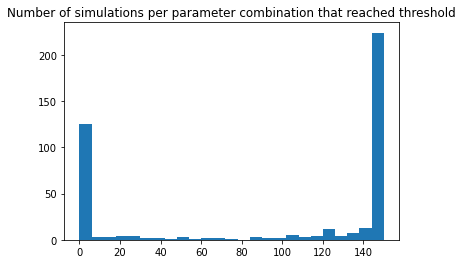

     ba-m  simple-spread-chance  citizen-citizen-influence  \
47      3                  0.05                       0.05   
52      3                  0.05                       0.10   
53      3                  0.05                       0.10   
57      3                  0.05                       0.25   
58      3                  0.05                       0.25   
..    ...                   ...                        ...   
427    10                  0.75                       0.75   
428    10                  0.75                       0.75   
429    10                  0.75                       0.75   
430    10                  0.75                       0.75   
431    10                  0.75                       0.75   

     citizen-media-influence threshold  
47                      0.75        50  
52                      0.50        63  
53                      0.75       115  
57                      0.25        36  
58                      0.50       121  
..       

In [32]:
#in order to count the number of simulations for each parameter combination, I will sum the numebr of thresholds by matches 
#in each parameter

#each parameter combination was run 5 times on 5 graphs --> max number of runs that surpass threshold = 25

infl_mod_thresh_count=infl_mod.copy()
infl_mod_thresh_count=infl_mod_thresh_count.groupby(["ba-m", 'simple-spread-chance', 'citizen-citizen-influence', 'citizen-media-influence'])['threshold'].sum().reset_index()
print(infl_mod_thresh_count)

infl_mod_thresh_count.to_csv("infl_mod_thresh_count.csv")

plt.hist(infl_mod_thresh_count["threshold"], bins=25)
plt.title('Number of simulations per parameter combination that reached threshold')
plt.show()

infl_mod_thresh_count=infl_mod_thresh_count.loc[infl_mod_thresh_count['threshold']>=20]
print(infl_mod_thresh_count)


The results above suggest that a majority of the parameters combinations do not spread to a large proportion of the population. We are interested in the cases that do. For this reason, I will select all parameter combinations that have more than 20/25 simulations reach the threshold for futher analysis. There are 113 parameter combinations that fit this. I will edit the main file to have a column about whether or not the parameter combination reached the threshold.

In [15]:
#add success/not success column

infl_mod['param-thresh']=None
for i in range(0, len(infl_mod_thresh_count)):
    ba_m_val = infl_mod_thresh_count['ba-m'].iloc[i]
    simple_spread_chance_val = infl_mod_thresh_count['simple-spread-chance'].iloc[i]
    cit_cit_in_val = infl_mod_thresh_count['citizen-citizen-influence'].iloc[i]
    cit_med_val = infl_mod_thresh_count['citizen-media-influence'].iloc[i]
    print('next param setting',i)
    for j in range(0, len(infl_mod)):
        if infl_mod['ba-m'].iloc[j] == ba_m_val:
            if infl_mod['simple-spread-chance'].iloc[j] == simple_spread_chance_val:
                if infl_mod['citizen-citizen-influence'].iloc[j] == cit_cit_in_val:
                    if infl_mod['citizen-media-influence'].iloc[j] == cit_med_val:
                        infl_mod['param-thresh'].iloc[j] = 1
                    else:
                        pass
                else:
                    pass
            else:
                pass
        else:
            pass

infl_mod.to_csv('infl_mod_with_param_thresh.csv')            
print(infl_mod)
    
    
    

next param setting 0
next param setting 1
next param setting 2
next param setting 3
next param setting 4
next param setting 5
next param setting 6
next param setting 7
next param setting 8
next param setting 9
next param setting 10
next param setting 11
next param setting 12
next param setting 13
next param setting 14
next param setting 15
next param setting 16
next param setting 17
next param setting 18
next param setting 19
next param setting 20
next param setting 21
next param setting 22
next param setting 23
next param setting 24
next param setting 25
next param setting 26
next param setting 27
next param setting 28
next param setting 29
next param setting 30
next param setting 31
next param setting 32
next param setting 33
next param setting 34
next param setting 35
next param setting 36
next param setting 37
next param setting 38
next param setting 39
next param setting 40
next param setting 41
next param setting 42
next param setting 43
next param setting 44
next param setting 4

In [16]:
#this code will limit the dataframe to those who have passed our threshold calculations
infl_mod=infl_mod.loc[infl_mod['param-thresh'] == 1]

#infl_mod is now a dataframe of all simulations within parameter combinations where the threshold of 70% spread was passed 20/25 times
#now we can sort by the median peak-time value (the metric that best represents our question)
infl_mod_time_median=infl_mod.copy()
infl_mod_time_median=infl_mod_time_median.groupby(["ba-m", 'simple-spread-chance', 'citizen-citizen-influence', 'citizen-media-influence'])['peak-time'].median().reset_index()
print(infl_mod_time_median)

infl_mod_time_median.to_csv("infl_mod_time_median.csv")










     ba-m  simple-spread-chance  citizen-citizen-influence  \
0       3                  0.05                       0.05   
1       3                  0.05                       0.10   
2       3                  0.05                       0.10   
3       3                  0.05                       0.25   
4       3                  0.05                       0.25   
..    ...                   ...                        ...   
296    10                  0.75                       0.75   
297    10                  0.75                       0.75   
298    10                  0.75                       0.75   
299    10                  0.75                       0.75   
300    10                  0.75                       0.75   

     citizen-media-influence  peak-time  
0                       0.75       81.0  
1                       0.50       77.0  
2                       0.75       65.5  
3                       0.25       75.0  
4                       0.50       60.0  
.. 

In [20]:
#Now I will take a look at the top hits here,  using the dataframe previously saved as a csv so we don't have to regenerate it
#this will generate the top 20 parameter combinations
df=pd.read_csv("infl_mod_with_param_thresh.csv")
#old method for this

g_data=pd.read_csv("google-trends.csv")
g_data.columns=['week', 'data']
goog_data= g_data['data'].to_list()

time_list=[]
for i in range(0, 114):
    time_list.append(i)

In [9]:
#all rows
infl_mod_time_median= pd.read_csv("infl_mod_time_median.csv")
for i in range(0, 114):
    ba_m_val = infl_mod_time_median['ba-m'].iloc[i]
    p_ = infl_mod_time_median['simple-spread-chance'].iloc[i]
    cit_cit = infl_mod_time_median['citizen-citizen-influence'].iloc[i]
    cit_media = infl_mod_time_median['citizen-media-influence'].iloc[i]
    data_1= df.loc[df['ba-m']==ba_m_val]
    data_1=data_1.loc[data_1['simple-spread-chance']==p_]
    data_1=data_1.loc[data_1['citizen-citizen-influence']==cit_cit]
    data_1=data_1.loc[data_1['citizen-media-influence']==cit_media]
    for j in range(0, 114):
        data=data_1['unscaled-list'].iloc[j]
        data_list=data.strip('][').split(', ')
        new_list=[]
        for j in range(0, len(data_list)):
            item=float(data_list[j])
            new_list.append(item)
        val=i
        plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False, labelsize=20)
        plt.plot(time_list, new_list, color='red')
    

    plt.plot(time_list, goog_data, color='blue', lw=3, label="google")
    plt.legend()
    plt.title(i, fontsize=20)
    #plt.show()

    

NameError: name 'df' is not defined

# This kind of analysis is really good at telling us what parameters can lead to a delay in the peak, but it is less effective at saying these are specific 'enabling conditions'. In fact, it may be interesting to look at the range where only a few runs reached the threshold to be able to differentiate those that reach it and those that don't. Otherwise, we are looking only for ways that slow down peaks of runs that already reach the population, which doesn't fulfill the goals of organizers.

By completing this analysis, we answer the question: what parameter combinations regularly meet our threshold (and of these), some of them have the peak delay). What if instead of threshold first, peak second, I put time first..... this will help us determine which parameter setting is our baseline (little spread with little peak) and then we can study how that changes with different sensitivity analysis)? 

In [10]:
infl_mod_thresh_count=infl_mod.copy()
infl_mod_time_count=infl_mod_thresh_count.groupby(["ba-m", 'simple-spread-chance', 'citizen-citizen-influence', 'citizen-media-influence'])['peak-time'].median().reset_index()
print(infl_mod_time_count)


df=pd.read_csv("influence_mod_with_metrics.csv")
#old method for this

g_data=pd.read_csv("google-trends.csv")
g_data.columns=['week', 'data']
goog_data= g_data['data'].to_list()

time_list=[]
for i in range(0, 114):
    time_list.append(i)
#infl_mod_thresh_count=infl_mod_thresh_count.loc[infl_mod_thresh_count['threshold']>=20]

infl_mod_time_median= infl_mod_time_count
for i in range(0, len(infl_mod_time_median)):
    ba_m_val = infl_mod_time_median['ba-m'].iloc[i]
    p_ = infl_mod_time_median['simple-spread-chance'].iloc[i]
    cit_cit = infl_mod_time_median['citizen-citizen-influence'].iloc[i]
    cit_media = infl_mod_time_median['citizen-media-influence'].iloc[i]
    data_1= df.loc[df['ba-m']==ba_m_val]
    data_1=data_1.loc[data_1['simple-spread-chance']==p_]
    data_1=data_1.loc[data_1['citizen-citizen-influence']==cit_cit]
    data_1=data_1.loc[data_1['citizen-media-influence']==cit_media]
    plt.figure(figsize=(30,10))
    for j in range(0, len(data_1)):
        data=data_1['unscaled-list'].iloc[j]
        data_list=data.strip('][').split(', ')
        new_list=[]
        for j in range(0, len(data_list)):
            item=float(data_list[j])
            new_list.append(item)
        val=i
        
        plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False, labelsize=20)
        plt.plot(time_list, new_list, color='red')
    plt.vlines(91, 0, 50, color = 'blue')

    plt.title(i, fontsize=20)
    #plt.show()


NameError: name 'infl_mod' is not defined

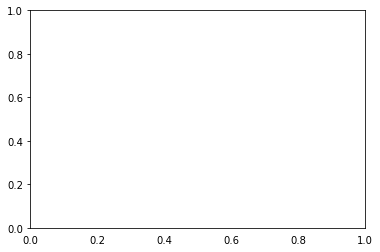

In [5]:
# test
df=pd.read_csv("influence_mod_with_metrics.csv")
g_data=pd.read_csv("google-trends.csv")
g_data.columns=['week', 'data']
goog_data= g_data['data'].to_list()

time_list=[]
for i in range(0, 114):
    time_list.append(i)
data_1= df.loc[df['ba-m']==10]
data_1=data_1.loc[data_1['simple-spread-chance']==0.5]
data_1=data_1.loc[data_1['citizen-citizen-influence']==0.05]
data_1=data_1.loc[data_1['citizen-media-influence']==0.01]

for i in range(0, len(data_1)):
    data=data_1['short list'].iloc[i]
    data_list=data.strip('][').split(', ')
    new_list=[]
    for j in range(0, len(data_list)):
        item=float(data_list[j])
        new_list.append(item)
    val=i
    plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False)
   # plt.plot(time_list, new_list, color='red')
  #  plt.plot(time_list, goog_data, color='blue', lw=3, label="google")
  #  plt.legend()
  #  plt.title(i)
    #plt.show()



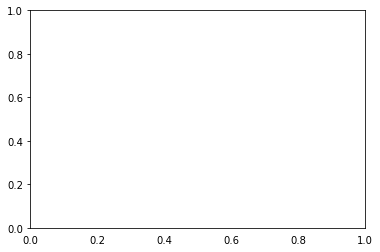

In [6]:
# run 414
df=pd.read_csv("influence_mod_with_metrics.csv")
g_data=pd.read_csv("google-trends.csv")
g_data.columns=['week', 'data']
goog_data= g_data['data'].to_list()

time_list=[]
for i in range(0, 114):
    time_list.append(i)
data_1= df.loc[df['ba-m']==10]
data_1=data_1.loc[data_1['simple-spread-chance']==0.75]
data_1=data_1.loc[data_1['citizen-citizen-influence']==0.25]
data_1=data_1.loc[data_1['citizen-media-influence']==0.01]

for i in range(0, len(data_1)):
    data=data_1['short list'].iloc[i]
    data_list=data.strip('][').split(', ')
    new_list=[]
    for j in range(0, len(data_list)):
        item=float(data_list[j])
        new_list.append(item)
    val=i
    plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False)
    #plt.plot(time_list, new_list, color='red')
    #plt.plot(time_list, goog_data, color='blue', lw=3, label="google")
    #plt.legend()
    #plt.title(i)
    #plt.show()

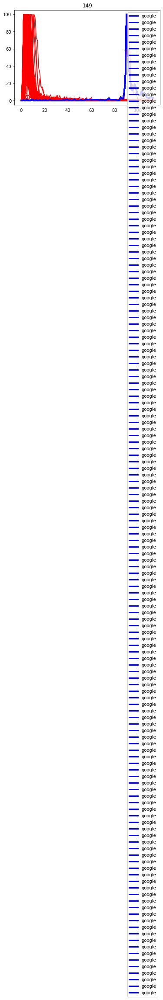

In [13]:
# run 392
df=pd.read_csv("influence_mod_with_metrics.csv")
g_data=pd.read_csv("google-trends.csv")
g_data.columns=['week', 'data']
goog_data= g_data['data'].to_list()

time_list=[]
for i in range(0, 114):
    time_list.append(i)
data_1= df.loc[df['ba-m']==10]
data_1=data_1.loc[data_1['simple-spread-chance']==0.5]
data_1=data_1.loc[data_1['citizen-citizen-influence']==0.75]
data_1=data_1.loc[data_1['citizen-media-influence']==0.1]

for i in range(0, len(data_1)):
    data=data_1['short list'].iloc[i]
    data_list=data.strip('][').split(', ')
    new_list=[]
    for j in range(0, len(data_list)):
        item=float(data_list[j])
        new_list.append(item)
    val=i
    plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False)
    plt.plot(time_list, new_list, color='red')
    plt.plot(time_list, goog_data, color='blue', lw=3, label="google")
    plt.legend()
    plt.title(i)
   # plt.show()

In [7]:
# run 391
df=pd.read_csv("influence_mod_with_metrics.csv")
g_data=pd.read_csv("google-trends.csv")
g_data.columns=['week', 'data']
goog_data= g_data['data'].to_list()

time_list=[]
for i in range(0, 114):
    time_list.append(i)
data_1= df.loc[df['ba-m']==10]
data_1=data_1.loc[data_1['simple-spread-chance']==0.5]
data_1=data_1.loc[data_1['citizen-citizen-influence']==0.75]
data_1=data_1.loc[data_1['citizen-media-influence']==0.05]

for i in range(0, len(data_1)):
    data=data_1['short list'].iloc[i]
    data_list=data.strip('][').split(', ')
    new_list=[]
    for j in range(0, len(data_list)):
        item=float(data_list[j])
        new_list.append(item)
    val=i
    #plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False)
    #plt.plot(time_list, new_list, color='red')
    #plt.plot(time_list, goog_data, color='blue', lw=3, label="google")
    #plt.legend()
    #plt.title(i)
    #plt.show()

In [8]:
# run 420
df=pd.read_csv("influence_mod_with_metrics.csv")
g_data=pd.read_csv("google-trends.csv")
g_data.columns=['week', 'data']
goog_data= g_data['data'].to_list()

time_list=[]
for i in range(0, 114):
    time_list.append(i)
data_1= df.loc[df['ba-m']==10]
data_1=data_1.loc[data_1['simple-spread-chance']==0.75]
data_1=data_1.loc[data_1['citizen-citizen-influence']==0.5]
data_1=data_1.loc[data_1['citizen-media-influence']==0.01]

for i in range(0, len(data_1)):
    data=data_1['short list'].iloc[i]
    data_list=data.strip('][').split(', ')
    new_list=[]
    for j in range(0, len(data_list)):
        item=float(data_list[j])
        new_list.append(item)
    val=i
   # plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False)
   # plt.plot(time_list, new_list, color='red')
   # plt.plot(time_list, goog_data, color='blue', lw=3, label="google")
   # plt.legend()
   # plt.title(i)
   # plt.show()
    
    #look at runs 61/62/70/71/73//89

In [9]:
# run 402
df=pd.read_csv("influence_mod_with_metrics.csv")
g_data=pd.read_csv("google-trends.csv")
g_data.columns=['week', 'data']
goog_data= g_data['data'].to_list()

time_list=[]
for i in range(0, 114):
    time_list.append(i)
data_1= df.loc[df['ba-m']==10]
data_1=data_1.loc[data_1['simple-spread-chance']==0.75]
data_1=data_1.loc[data_1['citizen-citizen-influence']==0.05]
data_1=data_1.loc[data_1['citizen-media-influence']==0.01]

for i in range(0, len(data_1)):
    data=data_1['short list'].iloc[i]
    data_list=data.strip('][').split(', ')
    new_list=[]
    for j in range(0, len(data_list)):
        item=float(data_list[j])
        new_list.append(item)
    val=i
   # plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False)
   # plt.plot(time_list, new_list, color='red')
   # plt.plot(time_list, goog_data, color='blue', lw=3, label="google")
   # plt.legend()
   # plt.title(i)
   # plt.show()

In [10]:
# run 414
df=pd.read_csv("influence_mod_with_metrics.csv")
g_data=pd.read_csv("google-trends.csv")
g_data.columns=['week', 'data']
goog_data= g_data['data'].to_list()

time_list=[]
for i in range(0, 114):
    time_list.append(i)
data_1= df.loc[df['ba-m']==10]
data_1=data_1.loc[data_1['simple-spread-chance']==0.75]
data_1=data_1.loc[data_1['citizen-citizen-influence']==0.25]
data_1=data_1.loc[data_1['citizen-media-influence']==0.01]

for i in range(0, len(data_1)):
    data=data_1['short list'].iloc[i]
    data_list=data.strip('][').split(', ')
    new_list=[]
    for j in range(0, len(data_list)):
        item=float(data_list[j])
        new_list.append(item)
    val=i
   # plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False)
   # plt.plot(time_list, new_list, color='red')
   # plt.plot(time_list, goog_data, color='blue', lw=3, label="google")
   # plt.legend()
   # plt.title(i)
   # plt.show()
    
    #run 35/36/37/39/47/53/59

In [11]:
# run 426
df=pd.read_csv("influence_mod_with_metrics.csv")
g_data=pd.read_csv("google-trends.csv")
g_data.columns=['week', 'data']
goog_data= g_data['data'].to_list()

time_list=[]
for i in range(0, 114):
    time_list.append(i)
data_1= df.loc[df['ba-m']==10]
data_1=data_1.loc[data_1['simple-spread-chance']==0.75]
data_1=data_1.loc[data_1['citizen-citizen-influence']==0.75]
data_1=data_1.loc[data_1['citizen-media-influence']==0.01]

for i in range(0, len(data_1)):
    data=data_1['short list'].iloc[i]
    data_list=data.strip('][').split(', ')
    new_list=[]
    for j in range(0, len(data_list)):
        item=float(data_list[j])
        new_list.append(item)
    val=i
  #  plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False)
  #  plt.plot(time_list, new_list, color='red')
  #  plt.plot(time_list, goog_data, color='blue', lw=3, label="google")
  #  plt.legend()
  #  plt.title(i)
  #  plt.show()

In [13]:
#While we wait for runs.... let's see if we can nail down exactly how the parameters shift plot

#parameter space- lets not limit it to threshold rn if possible

ba_m_list= [3,10]
p_list= [0.01, 0.05, 0.1, 0.25, 0.5, 0.75]
cit_cit_list= [0.01, 0.05, 0.1, 0.25, 0.5, 0.75]
cit_media_list = [0.01, 0.05, 0.1, 0.25, 0.5, 0.75]

#use infl_mod_with-metrics csv
sweep = pd.read_csv("influence_mod_with_metrics.csv")

g_data=pd.read_csv("google-trends.csv")
g_data.columns=['week', 'data']
goog_data= g_data['data'].to_list()

time_list=[]
for i in range(0, 114):
    time_list.append(i)

#Q1: How does ba-m affect it?
#we can do plots of direct comparisons? or points of median times?
#can also look at figures

#BA-M EXplore
   
for j in range(0, len(p_list)):
    sweep_p = sweep.loc[sweep['simple-spread-chance'] == p_list[j]]
    for h in range(0, len(cit_cit_list)):
        sweep_c_c = sweep_p.loc[sweep_p["citizen-citizen-influence"] == cit_cit_list[h]]
        for k in range(0, len(cit_media_list)):
            sweep_c_m = sweep_c_c.loc[sweep_c_c["citizen-media-influence"] == cit_media_list[k]]
            ba_3_runs = sweep_c_m.loc[sweep_c_m["ba-m"] == 3]
            ba_10_runs = sweep_c_m.loc[sweep_c_m["ba-m"] == 10]
           # print(len(ba_3_runs))
           # print(len(ba_10_runs))
            for a in range(0, len(ba_3_runs)):  
                data=ba_3_runs['short list'].iloc[a]
                data_list=data.strip('][').split(', ')
                new_list=[]
                for i in range(0, len(data_list)):
                    item=float(data_list[i])
                    new_list.append(item)
               # plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False)
               # plt.plot(time_list, new_list, color='red')
            for b in range(0, len(ba_10_runs)):  
                data=ba_10_runs['short list'].iloc[b]
                data_list=data.strip('][').split(', ')
                new_list=[]
                for l in range(0, len(data_list)):
                    item=float(data_list[l])
                    new_list.append(item)
              #  plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False)
              #  plt.plot(time_list, new_list, color='green')
         #   plt.plot(time_list, goog_data, color='blue', lw=3, label="google")
         #   plt.show()
            
            
    
                         
                         
                    
                
                
                   

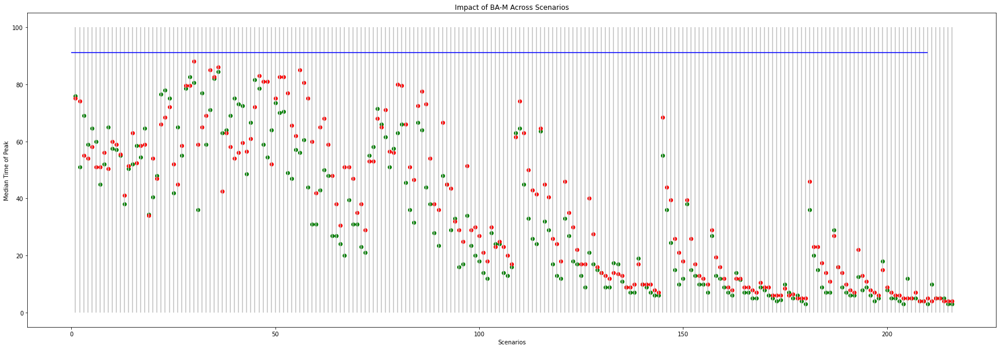

In [2]:
#cool so above works- now lets try to make a summary plot because this is really difficult
import statistics
sweep = pd.read_csv("influence_mod_with_metrics.csv")

g_data=pd.read_csv("google-trends.csv")
g_data.columns=['week', 'data']
goog_data= g_data['data'].to_list()

time_list=[]
for i in range(0, 114):
    time_list.append(i)

ba_m_list= [3,10]
p_list= [0.01, 0.05, 0.1, 0.25, 0.5, 0.75]
cit_cit_list= [0.01, 0.05, 0.1, 0.25, 0.5, 0.75]
cit_media_list = [0.01, 0.05, 0.1, 0.25, 0.5, 0.75]

difference_list=[]

plt.figure(figsize=(30,10))
i = 0
for j in range(0, len(p_list)):
    sweep_p = sweep.loc[sweep['simple-spread-chance'] == p_list[j]]
    for h in range(0, len(cit_cit_list)):
        sweep_c_c = sweep_p.loc[sweep_p["citizen-citizen-influence"] == cit_cit_list[h]]
        for k in range(0, len(cit_media_list)):
            sweep_c_m = sweep_c_c.loc[sweep_c_c["citizen-media-influence"] == cit_media_list[k]]
            ba_3_runs = sweep_c_m.loc[sweep_c_m["ba-m"] == 3]
            ba_10_runs = sweep_c_m.loc[sweep_c_m["ba-m"] == 10]
            ba_3_peak_time_list = []
            ba_10_peak_time_list=[]
            #print(len(ba_3_runs))
            #print(len(ba_10_runs))
            #median peak time with range of 25% to 75% of median
            for a in range(0, len(ba_3_runs)):  
                peak_time = ba_3_runs['peak-time'].iloc[a]
                ba_3_peak_time_list.append(peak_time)
            for b in range(0, len(ba_10_runs)):  
                peak_time = ba_10_runs['peak-time'].iloc[b]
                ba_10_peak_time_list.append(peak_time)
            ba_3_med = statistics.median(ba_3_peak_time_list)
            ba_10_med = statistics.median(ba_10_peak_time_list)
            difference = ba_3_med - ba_10_med
            difference_list.append(difference)
            i = i + 1
            
            #plt.plot([i,i], [ba_3_med, ba_10_med])
            plt.scatter(i, ba_10_med, c = 'green')
            plt.scatter(i, ba_3_med, c = 'red')
            
            plt.vlines(i, 0, 100, color = 'silver')
plt.hlines(91,0, 210, color = 'blue')
            
plt.title("Impact of BA-M Across Scenarios")
plt.ylabel('Median Time of Peak')
plt.xlabel('Scenarios')
plt.savefig("ba-m_scenario.png")
plt.show()




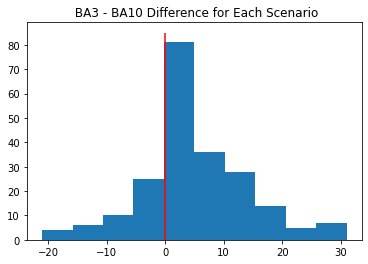

In [84]:
plt.hist(difference_list)
plt.title(" BA3 - BA10 Difference for Each Scenario")
plt.vlines(0, 0, 85, color = 'red')
plt.savefig('ba-m_diff.png')
plt.show()

#conclusion- BA3 leads to a later peak

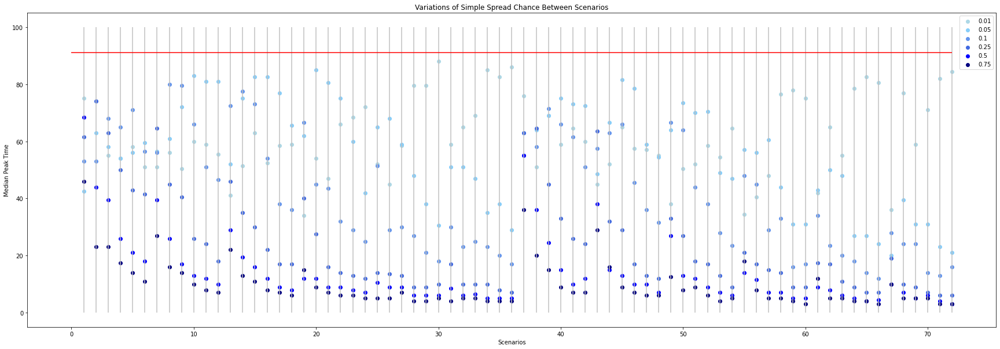

In [85]:
# lets repeat the process for p

plt.figure(figsize=(30,10))
i = 0
for j in range(0, len(ba_m_list)):
    sweep_p = sweep.loc[sweep['ba-m'] == ba_m_list[j]]
    for h in range(0, len(cit_cit_list)):
        sweep_c_c = sweep_p.loc[sweep_p["citizen-citizen-influence"] == cit_cit_list[h]]
        for k in range(0, len(cit_media_list)):
            sweep_c_m = sweep_c_c.loc[sweep_c_c["citizen-media-influence"] == cit_media_list[k]]
            p_01_runs = sweep_c_m.loc[sweep_c_m["simple-spread-chance"] == 0.01]
            p_05_runs = sweep_c_m.loc[sweep_c_m["simple-spread-chance"] == 0.05]
            p_1_runs = sweep_c_m.loc[sweep_c_m["simple-spread-chance"] == 0.1]
            p_25_runs = sweep_c_m.loc[sweep_c_m["simple-spread-chance"] == 0.25]
            p_5_runs = sweep_c_m.loc[sweep_c_m["simple-spread-chance"] == 0.5]
            p_75_runs = sweep_c_m.loc[sweep_c_m["simple-spread-chance"] == 0.75]
            p_01_peak_time_list = []
            p_05_peak_time_list = []
            p_1_peak_time_list = []
            p_25_peak_time_list = []
            p_5_peak_time_list = []
            p_75_peak_time_list = []
            #median peak time with range of 25% to 75% of median
            for a in range(0, len(p_01_runs)):  
                peak_time = p_01_runs['peak-time'].iloc[a]
                p_01_peak_time_list.append(peak_time)
            for b in range(0, len(p_05_runs)):  
                peak_time = p_05_runs['peak-time'].iloc[b]
                p_05_peak_time_list.append(peak_time)
            for c in range(0, len(p_1_runs)):  
                peak_time = p_1_runs['peak-time'].iloc[c]
                p_1_peak_time_list.append(peak_time)
            for d in range(0, len(p_25_runs)):  
                peak_time = p_25_runs['peak-time'].iloc[d]
                p_25_peak_time_list.append(peak_time)
            for e in range(0, len(p_5_runs)):  
                peak_time = p_5_runs['peak-time'].iloc[e]
                p_5_peak_time_list.append(peak_time)
            for f in range(0, len(p_75_runs)):  
                peak_time = p_75_runs['peak-time'].iloc[f]
                p_75_peak_time_list.append(peak_time)
            
            p_01_med = statistics.median(p_01_peak_time_list)
            p_05_med = statistics.median(p_05_peak_time_list)
            p_1_med = statistics.median(p_1_peak_time_list)
            p_25_med = statistics.median(p_25_peak_time_list)
            p_5_med = statistics.median(p_5_peak_time_list)
            p_75_med = statistics.median(p_75_peak_time_list)      
            i = i + 1
            
            #plt.plot([i,i], [ba_3_med, ba_10_med])
            plt.scatter(i, p_01_med, c = 'lightblue', label = '0.01')
            plt.scatter(i, p_05_med, c = 'lightskyblue', label = '0.05')
            plt.scatter(i, p_1_med, c = 'cornflowerblue', label = '0.1')
            plt.scatter(i, p_25_med, c = 'royalblue', label = '0.25')
            plt.scatter(i, p_5_med, c = 'blue', label = '0.5')
            plt.scatter(i, p_75_med, c = 'navy', label = '0.75')
            
            plt.vlines(i, 0, 100, color = 'silver')
            if i == 1:
                plt.legend()
plt.hlines(91, 0, 72, color = 'red', label = 'google')
plt.title("Variations of Simple Spread Chance Between Scenarios")
plt.xlabel('Scenarios')
plt.ylabel("Median Peak Time")
plt.savefig('ssc_scen.png')
plt.show()


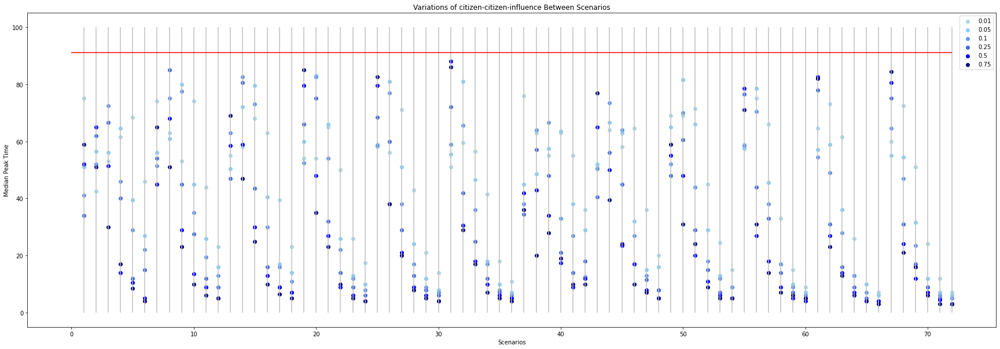

In [86]:
#now for cit-cit

plt.figure(figsize=(30,10))
i = 0
for j in range(0, len(ba_m_list)):
    sweep_p = sweep.loc[sweep['ba-m'] == ba_m_list[j]]
    for h in range(0, len(cit_media_list)):
        sweep_c_c = sweep_p.loc[sweep_p["citizen-media-influence"] == cit_media_list[h]]
        for k in range(0, len(p_list)):
            sweep_c_m = sweep_c_c.loc[sweep_c_c["simple-spread-chance"] == p_list[k]]
            p_01_runs = sweep_c_m.loc[sweep_c_m["citizen-citizen-influence"] == 0.01]
            p_05_runs = sweep_c_m.loc[sweep_c_m["citizen-citizen-influence"] == 0.05]
            p_1_runs = sweep_c_m.loc[sweep_c_m["citizen-citizen-influence"] == 0.1]
            p_25_runs = sweep_c_m.loc[sweep_c_m["citizen-citizen-influence"] == 0.25]
            p_5_runs = sweep_c_m.loc[sweep_c_m["citizen-citizen-influence"] == 0.5]
            p_75_runs = sweep_c_m.loc[sweep_c_m["citizen-citizen-influence"] == 0.75]
            p_01_peak_time_list = []
            p_05_peak_time_list = []
            p_1_peak_time_list = []
            p_25_peak_time_list = []
            p_5_peak_time_list = []
            p_75_peak_time_list = []
            #median peak time with range of 25% to 75% of median
            for a in range(0, len(p_01_runs)):  
                peak_time = p_01_runs['peak-time'].iloc[a]
                p_01_peak_time_list.append(peak_time)
            for b in range(0, len(p_05_runs)):  
                peak_time = p_05_runs['peak-time'].iloc[b]
                p_05_peak_time_list.append(peak_time)
            for c in range(0, len(p_1_runs)):  
                peak_time = p_1_runs['peak-time'].iloc[c]
                p_1_peak_time_list.append(peak_time)
            for d in range(0, len(p_25_runs)):  
                peak_time = p_25_runs['peak-time'].iloc[d]
                p_25_peak_time_list.append(peak_time)
            for e in range(0, len(p_5_runs)):  
                peak_time = p_5_runs['peak-time'].iloc[e]
                p_5_peak_time_list.append(peak_time)
            for f in range(0, len(p_75_runs)):  
                peak_time = p_75_runs['peak-time'].iloc[f]
                p_75_peak_time_list.append(peak_time)
            
            p_01_med = statistics.median(p_01_peak_time_list)
            p_05_med = statistics.median(p_05_peak_time_list)
            p_1_med = statistics.median(p_1_peak_time_list)
            p_25_med = statistics.median(p_25_peak_time_list)
            p_5_med = statistics.median(p_5_peak_time_list)
            p_75_med = statistics.median(p_75_peak_time_list)      
            i = i + 1
            
            #plt.plot([i,i], [ba_3_med, ba_10_med])
            plt.scatter(i, p_01_med, c = 'lightblue', label = '0.01')
            plt.scatter(i, p_05_med, c = 'lightskyblue', label = '0.05')
            plt.scatter(i, p_1_med, c = 'cornflowerblue', label = '0.1')
            plt.scatter(i, p_25_med, c = 'royalblue', label = '0.25')
            plt.scatter(i, p_5_med, c = 'blue', label = '0.5')
            plt.scatter(i, p_75_med, c = 'navy', label = '0.75')
            
            plt.vlines(i, 0, 100, color = 'silver')
            if i == 1:
                plt.legend()
plt.hlines(91, 0, 72, color = 'red', label = 'google')

plt.title("Variations of citizen-citizen-influence Between Scenarios")
plt.xlabel('Scenarios')
plt.ylabel("Median Peak Time")
plt.savefig('cit-cit-scen.png')
plt.show()



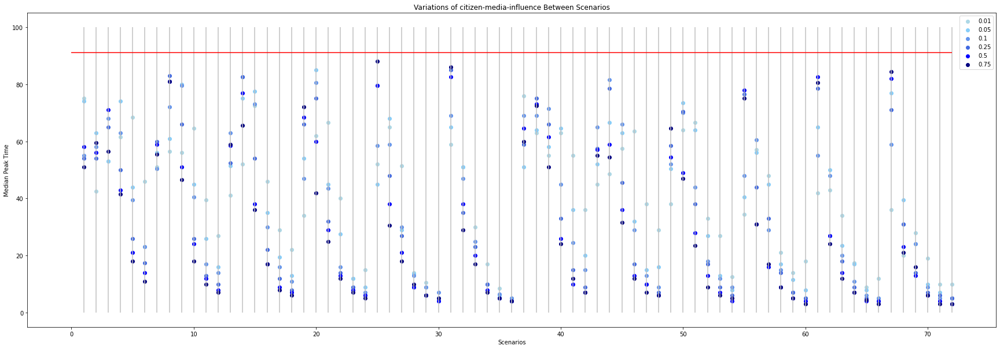

In [82]:
#and cit-media

plt.figure(figsize=(30,10))
i = 0
for j in range(0, len(ba_m_list)):
    sweep_p = sweep.loc[sweep['ba-m'] == ba_m_list[j]]
    for h in range(0, len(cit_media_list)):
        sweep_c_c = sweep_p.loc[sweep_p["citizen-citizen-influence"] == cit_cit_list[h]]
        for k in range(0, len(p_list)):
            sweep_c_m = sweep_c_c.loc[sweep_c_c["simple-spread-chance"] == p_list[k]]
            p_01_runs = sweep_c_m.loc[sweep_c_m["citizen-media-influence"] == 0.01]
            p_05_runs = sweep_c_m.loc[sweep_c_m["citizen-media-influence"] == 0.05]
            p_1_runs = sweep_c_m.loc[sweep_c_m["citizen-media-influence"] == 0.1]
            p_25_runs = sweep_c_m.loc[sweep_c_m["citizen-media-influence"] == 0.25]
            p_5_runs = sweep_c_m.loc[sweep_c_m["citizen-media-influence"] == 0.5]
            p_75_runs = sweep_c_m.loc[sweep_c_m["citizen-media-influence"] == 0.75]
            p_01_peak_time_list = []
            p_05_peak_time_list = []
            p_1_peak_time_list = []
            p_25_peak_time_list = []
            p_5_peak_time_list = []
            p_75_peak_time_list = []
            #median peak time with range of 25% to 75% of median
            for a in range(0, len(p_01_runs)):  
                peak_time = p_01_runs['peak-time'].iloc[a]
                p_01_peak_time_list.append(peak_time)
            for b in range(0, len(p_05_runs)):  
                peak_time = p_05_runs['peak-time'].iloc[b]
                p_05_peak_time_list.append(peak_time)
            for c in range(0, len(p_1_runs)):  
                peak_time = p_1_runs['peak-time'].iloc[c]
                p_1_peak_time_list.append(peak_time)
            for d in range(0, len(p_25_runs)):  
                peak_time = p_25_runs['peak-time'].iloc[d]
                p_25_peak_time_list.append(peak_time)
            for e in range(0, len(p_5_runs)):  
                peak_time = p_5_runs['peak-time'].iloc[e]
                p_5_peak_time_list.append(peak_time)
            for f in range(0, len(p_75_runs)):  
                peak_time = p_75_runs['peak-time'].iloc[f]
                p_75_peak_time_list.append(peak_time)
            
            p_01_med = statistics.median(p_01_peak_time_list)
            p_05_med = statistics.median(p_05_peak_time_list)
            p_1_med = statistics.median(p_1_peak_time_list)
            p_25_med = statistics.median(p_25_peak_time_list)
            p_5_med = statistics.median(p_5_peak_time_list)
            p_75_med = statistics.median(p_75_peak_time_list)      
            i = i + 1
            
            #plt.plot([i,i], [ba_3_med, ba_10_med])
            plt.scatter(i, p_01_med, c = 'lightblue', label = '0.01')
            plt.scatter(i, p_05_med, c = 'lightskyblue', label = '0.05')
            plt.scatter(i, p_1_med, c = 'cornflowerblue', label = '0.1')
            plt.scatter(i, p_25_med, c = 'royalblue', label = '0.25')
            plt.scatter(i, p_5_med, c = 'blue', label = '0.5')
            plt.scatter(i, p_75_med, c = 'navy', label = '0.75')
            
            plt.vlines(i, 0, 100, color = 'silver')
            if i == 1:
                plt.legend()
plt.hlines(91, 0, 72, color = 'red', label = 'google')

plt.title("Variations of citizen-media-influence Between Scenarios")
plt.xlabel('Scenarios')
plt.ylabel("Median Peak Time")
plt.savefig('cit-med-scen.png')
plt.show()


    citizen-citizen-influence  citizen-media-influence  peak-time
0                        0.01                     0.01       58.0
1                        0.01                     0.05       49.0
2                        0.01                     0.10       42.0
3                        0.01                     0.25       35.0
4                        0.01                     0.50       33.0
5                        0.01                     0.75       30.0
6                        0.05                     0.01       45.5
7                        0.05                     0.05       36.0
8                        0.05                     0.10       34.0
9                        0.05                     0.25       27.0
10                       0.05                     0.50       22.0
11                       0.05                     0.75       19.0
12                       0.10                     0.01       35.0
13                       0.10                     0.05       33.0
14        

<AxesSubplot:xlabel='citizen-citizen-influence', ylabel='citizen-media-influence'>

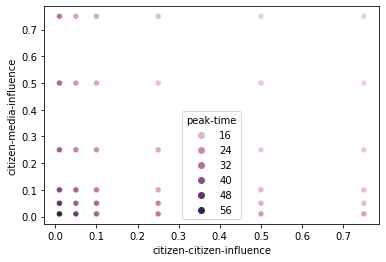

In [94]:
#Covariation maybe??- kinda shown in the normal plots
#HEAT MAP OF INTERSECTIONS OF CIT-CIT AND CIT-MEDIA-AND P???? lots of heat maps???

#maybe we can actually do some heat maps
import seaborn as sns
sweep_group=sweep.groupby(['citizen-citizen-influence', 'citizen-media-influence'])['peak-time'].median().reset_index()

#sweep_heatmap = sweep.pivot('citizen-citizen-influence', 'citizen-media-influence', 'peak-time')
print(sweep_group)

sns.scatterplot(data=sweep_group, x='citizen-citizen-influence', y='citizen-media-influence', hue='peak-time')

    simple-spread-chance  citizen-media-influence  peak-time
0                   0.01                     0.01       47.0
1                   0.01                     0.05       54.0
2                   0.01                     0.10       57.0
3                   0.01                     0.25       66.0
4                   0.01                     0.50       70.0
5                   0.01                     0.75       71.0
6                   0.05                     0.01       51.0
7                   0.05                     0.05       61.0
8                   0.05                     0.10       63.0
9                   0.05                     0.25       56.0
10                  0.05                     0.50       46.0
11                  0.05                     0.75       40.0
12                  0.10                     0.01       49.0
13                  0.10                     0.05       47.0
14                  0.10                     0.10       41.0
15                  0.10

<AxesSubplot:xlabel='simple-spread-chance', ylabel='citizen-media-influence'>

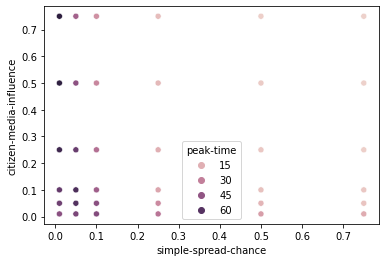

In [95]:
import seaborn as sns
sweep_group=sweep.groupby(['simple-spread-chance', 'citizen-media-influence'])['peak-time'].median().reset_index()

#sweep_heatmap = sweep.pivot('citizen-citizen-influence', 'citizen-media-influence', 'peak-time')
print(sweep_group)

sns.scatterplot(data=sweep_group, x='simple-spread-chance', y='citizen-media-influence', hue='peak-time')

    simple-spread-chance  citizen-citizen-influence  peak-time
0                   0.01                       0.01       60.0
1                   0.01                       0.05       56.0
2                   0.01                       0.10       53.0
3                   0.01                       0.25       59.0
4                   0.01                       0.50       71.0
5                   0.01                       0.75       72.5
6                   0.05                       0.01       63.0
7                   0.05                       0.05       70.5
8                   0.05                       0.10       66.0
9                   0.05                       0.25       54.0
10                  0.05                       0.50       41.0
11                  0.05                       0.75       33.0
12                  0.10                       0.01       61.0
13                  0.10                       0.05       53.0
14                  0.10                       0.10    

<AxesSubplot:xlabel='simple-spread-chance', ylabel='citizen-citizen-influence'>

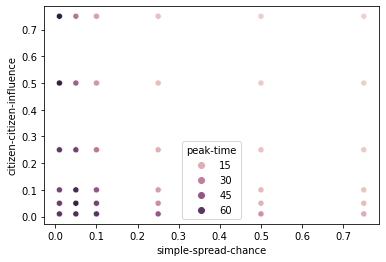

In [96]:
import seaborn as sns
sweep_group=sweep.groupby(['simple-spread-chance', 'citizen-citizen-influence'])['peak-time'].median().reset_index()

#sweep_heatmap = sweep.pivot('citizen-citizen-influence', 'citizen-media-influence', 'peak-time')
print(sweep_group)

sns.scatterplot(data=sweep_group, x='simple-spread-chance', y='citizen-citizen-influence', hue='peak-time')

In [17]:
import seaborn as sns
sweep_group=sweep.groupby(['citizen-citizen-influence', 'citizen-media-influence', 'simple-spread-chance'])['peak-time'].median().reset_index()

import plotly.express as px
fig = px.scatter_3d(sweep_group, x='simple-spread-chance', y = 'citizen-media-influence', z= 'citizen-citizen-influence', color='peak-time')
fig.show()

NameError: name 'sweep' is not defined

# Model 2: Static Organizing

In [43]:
#load in the csv file
org_mod = pd.read_csv('static-organizing-sweep.csv')
org_mod.columns = ['run', 'n', 'spread-type', 'simple-spread-chance', 'graph-type', 'ba-m', 'citizen-media-influence',
                  'citizen-citizen-influence', 'organizing-capacity', 'flint-organizing-strategy','repetition', 'data', 'num_media']

In [23]:
#process the csv and add columns to fill with metrics later

#short list represents both the shortened list to match the google trends data (114 weeks) and the processed data so that it
#is scaled out of 100 to better align with google data
org_mod["short list"]=None
org_mod['unscaled-list']=None
#threshold is a binary value representing whether or not the critical mass of the population has been reached (represented by
# 70%)
org_mod['threshold'] = None
#peak-time is the time at which the peak will occur
org_mod['peak-time']=None
#total spread is how many agents were reached in sum 
org_mod['total-spread']=None

#total-error is the total error
org_mod['total-error']=None
#r is caluclated as pearson's r
org_mod['r']= None


'''The three functions below are needed for data processing'''

def convertdata(data):
    sdata = data.strip(' ')
    ndata = nlogo_parse_chunk(sdata)
    n2data = [elem.replace('.', '') for elem in ndata]
    list=[]
    for x in n2data:
        list.append(x.replace("\r\n", ""))
    list = [i for i in list if i]
    return list

def nlogo_parse_chunk(chunk):
    chunk = chunk.strip().replace('"','')
    if chunk.count('[') > 1 and chunk[0] == '[':
        return nlogo_mixed_list_to_dict_rec(chunk[chunk.index('['):].strip())
    elif chunk.count('[') > 1 or chunk[0] != '[':
        return { chunk[0:chunk.index('[')].strip(): nlogo_mixed_list_to_dict_rec(chunk[chunk.index('['):].strip()) }

    pieces = chunk.strip().replace('[','').replace(']','').split(' ')
    if len(pieces) == 2:
        return { pieces[0]: pieces[1] }
    else:
        return pieces

def convert_to_int(data):
    for i in range(0, len(data)):
        data[i] = int(data[i])
    return data



'''This section goes through each simulation to update the dataframe with usable data and the metrics set up above'''
for i in range(0,org_mod.shape[0]):
    thresh=0
    error=0

    
    #set cutoff to the number of agents that need to hear about Flint to be considered a success- for this model, total runs are 
    #500 agents, so 350 represents 70% of them
    cutoff= (300 + int(org_mod['num_media'].iloc[i])) * 0.7
    
    run1 = org_mod["data"].iloc[i]
    finallist = convertdata(run1)
    int_data = convert_to_int(finallist)
    short_list=int_data[: 114]
    org_mod['unscaled-list'].iloc[i] = short_list
    scaled_short_list=[]
        #code below scales data from 0-100 to match google trends- this is needed to calculate total error, pearson's r, etc
    if max(short_list)>= 1:
        for k in range(0, len(short_list)):
            val=(short_list[k]/max(short_list))*100
            scaled_short_list.append(val)
        time_of_peak=short_list.index(max(short_list))
    else:
        time_of_peak = 0
        for k in range(0, len(short_list)):
            val = (short_list[k] / 1) * 100
            scaled_short_list.append(val)
    org_mod['short list'].iloc[i] = scaled_short_list
    for h in range(0, len(scaled_short_list)):
        thresh=thresh+int_data[h]
        error_addition=abs(scaled_short_list[h]-google_data[h])
        error=error+error_addition
    #since thresh is untransformed, we tabulate off of raw data cut to 114 weeks, not the scaled 0-100 data
    org_mod['total-spread'].iloc[i] = thresh
    if thresh >= cutoff:
        org_mod['threshold'].iloc[i] = 1
    else:
        org_mod['threshold'].iloc[i] = 0
  
    corr_coef=pearsonr(google_data,scaled_short_list)
    corr_val=corr_coef[0]
    org_mod['r'].iloc[i] = corr_val
    org_mod["total-error"].iloc[i]=error
    org_mod['peak-time'].iloc[i]=time_of_peak

        #2-week spread
        
    if i % 5000 == 0:
        print(i)



0
5000
10000
15000
20000
25000
30000
35000
40000
45000
50000
55000
60000
65000
70000
75000
80000
85000
90000
95000
100000


PermissionError: [Errno 13] Permission denied: 'influence_mod_with_metrics.csv'

In [24]:
org_mod.to_csv('org_mod_with_metrics.csv')

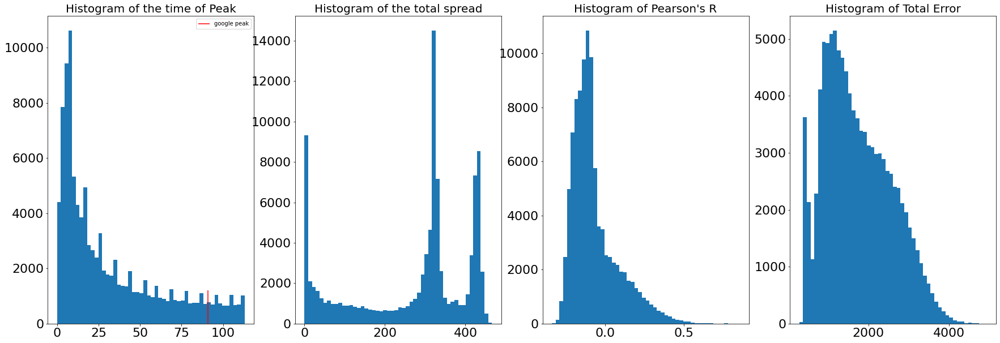

In [2]:
'''WHAT ARE THE RANGES OF EACH OF OUR METRICS?'''
#Note: this analysis uses all simulations, not limited to those that crossed the threshold. Because of this, there bin for peak
#spread = 100 is inflated, because this includes runs that went something like [0,0,0,0,1,0,0,0]

import matplotlib.pyplot as plt
import csv
import seaborn as sns
import pandas as pd

org_mod = pd.read_csv('org_mod_with_metrics.csv')

figure, axis = plt.subplots(1, 4, figsize= (30,10))

# For peak time
axis[0].hist(org_mod['peak-time'], bins=50)
axis[0].vlines(91, 0, 1200, color = 'red', label = 'google peak')
axis[0].set_title("Histogram of the time of Peak", size=20)
axis[0].legend()
axis[0].tick_params(axis='both', which='major', labelsize=22)
  
# For total-spread
axis[1].hist(org_mod['total-spread'], bins=50)
axis[1].set_title("Histogram of the total spread", size=20)
axis[1].tick_params(axis='both', which='major', labelsize=22)

# For pearson's r
axis[2].hist(org_mod['r'], bins=50)
axis[2].set_title("Histogram of Pearson's R", size=20)
axis[2].tick_params(axis='both', which='major', labelsize=22)

# For total error
axis[3].hist(org_mod['total-error'], bins=50)
axis[3].set_title("Histogram of Total Error", size=20)
axis[3].tick_params(axis='both', which='major', labelsize=22)
  
# Combine all the operations and display
plt.show()



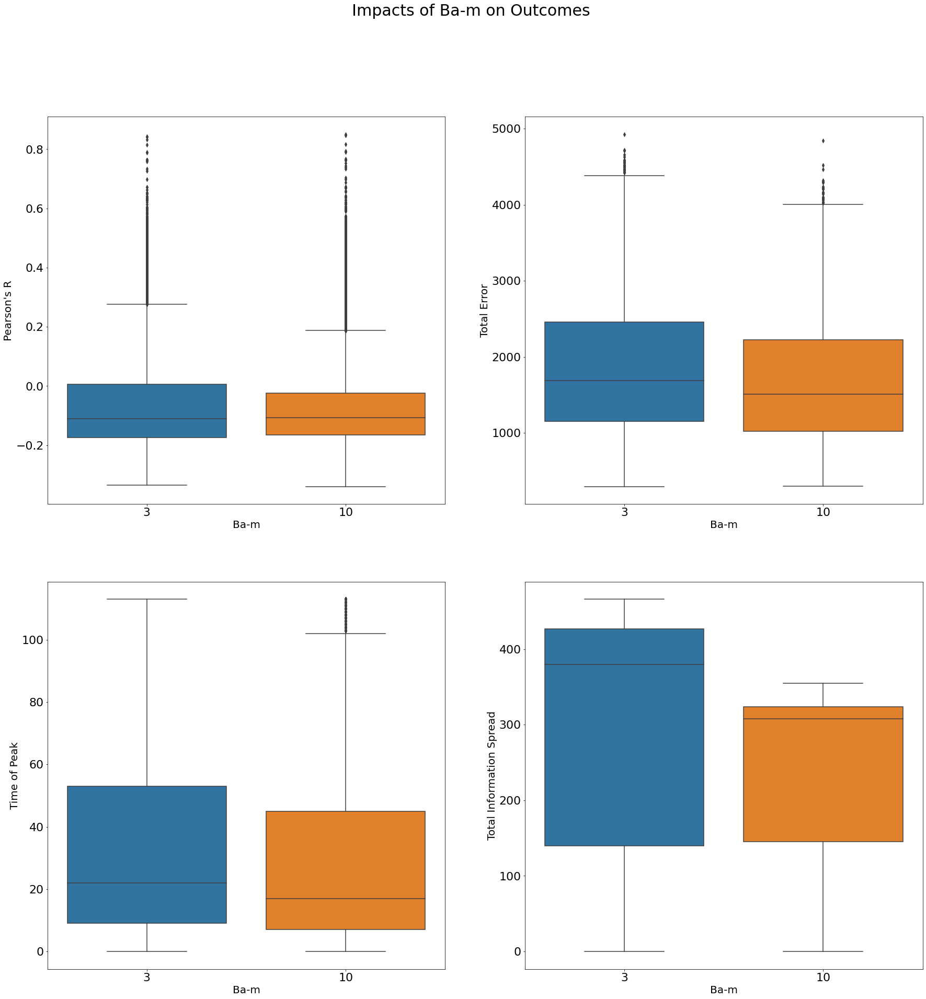

In [3]:
#Now we can explore how each parameter affected each metric

    
fig, axes=plt.subplots(2,2, figsize= (30,30))
fig.suptitle('Impacts of Ba-m on Outcomes', fontsize=30)


sns.boxplot(ax=axes[0,1], data= org_mod, x='ba-m', y='total-error')
axes[0,1].set_xlabel("Ba-m", fontsize=20)
axes[0,1].set_ylabel("Total Error", fontsize=20)
axes[0,1].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[0,0], data= org_mod, x='ba-m', y='r')
axes[0,0].set_xlabel("Ba-m", fontsize=20)
axes[0,0].set_ylabel("Pearson's R", fontsize=20)
axes[0,0].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[1,0], data= org_mod, x='ba-m', y='peak-time')
axes[1,0].set_xlabel("Ba-m", fontsize=20)
axes[1,0].set_ylabel("Time of Peak", fontsize=20)
axes[1,0].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[1,1], data= org_mod, x='ba-m', y='total-spread')
axes[1,1].set_xlabel("Ba-m", fontsize=20)
axes[1,1].set_ylabel("Total Information Spread", fontsize=20)
axes[1,1].tick_params(axis='both', which='major', labelsize=22)



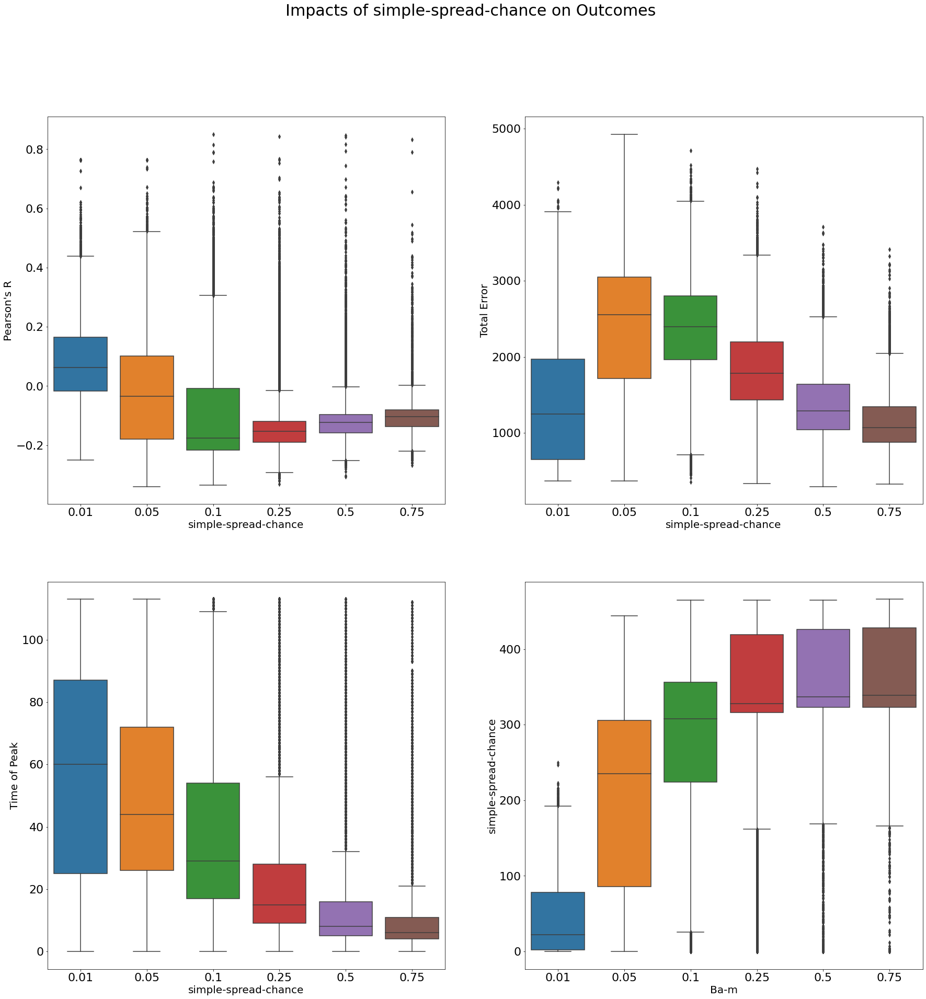

In [28]:
fig, axes=plt.subplots(2,2, figsize= (30,30))
fig.suptitle('Impacts of simple-spread-chance on Outcomes', fontsize=30)


sns.boxplot(ax=axes[0,1], data= org_mod, x='simple-spread-chance', y='total-error')
axes[0,1].set_xlabel("simple-spread-chance", fontsize=20)
axes[0,1].set_ylabel("Total Error", fontsize=20)
axes[0,1].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[0,0], data= org_mod, x='simple-spread-chance', y='r')
axes[0,0].set_xlabel("simple-spread-chance", fontsize=20)
axes[0,0].set_ylabel("Pearson's R", fontsize=20)
axes[0,0].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[1,0], data= org_mod, x='simple-spread-chance', y='peak-time')
axes[1,0].set_xlabel("simple-spread-chance", fontsize=20)
axes[1,0].set_ylabel("Time of Peak", fontsize=20)
axes[1,0].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[1,1], data= org_mod, x='simple-spread-chance', y='total-spread')
axes[1,1].set_xlabel("Ba-m", fontsize=20)
axes[1,1].set_ylabel("simple-spread-chance", fontsize=20)
axes[1,1].tick_params(axis='both', which='major', labelsize=22)

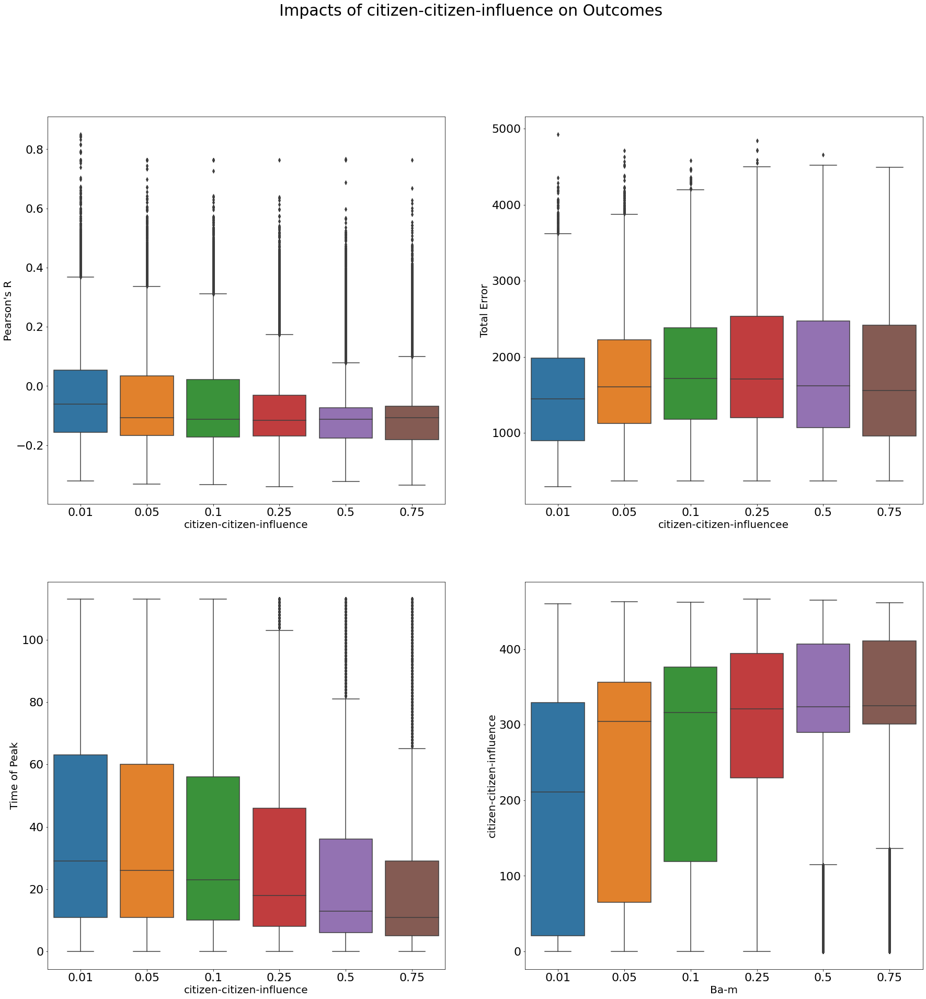

In [4]:
fig, axes=plt.subplots(2,2, figsize= (30,30))
fig.suptitle('Impacts of citizen-citizen-influence on Outcomes', fontsize=30)


sns.boxplot(ax=axes[0,1], data= org_mod, x='citizen-citizen-influence', y='total-error')
axes[0,1].set_xlabel("citizen-citizen-influencee", fontsize=20)
axes[0,1].set_ylabel("Total Error", fontsize=20)
axes[0,1].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[0,0], data= org_mod, x='citizen-citizen-influence', y='r')
axes[0,0].set_xlabel("citizen-citizen-influence", fontsize=20)
axes[0,0].set_ylabel("Pearson's R", fontsize=20)
axes[0,0].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[1,0], data= org_mod, x='citizen-citizen-influence', y='peak-time')
axes[1,0].set_xlabel("citizen-citizen-influence", fontsize=20)
axes[1,0].set_ylabel("Time of Peak", fontsize=20)
axes[1,0].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[1,1], data= org_mod, x='citizen-citizen-influence', y='total-spread')
axes[1,1].set_xlabel("Ba-m", fontsize=20)
axes[1,1].set_ylabel("citizen-citizen-influence", fontsize=20)
axes[1,1].tick_params(axis='both', which='major', labelsize=22)

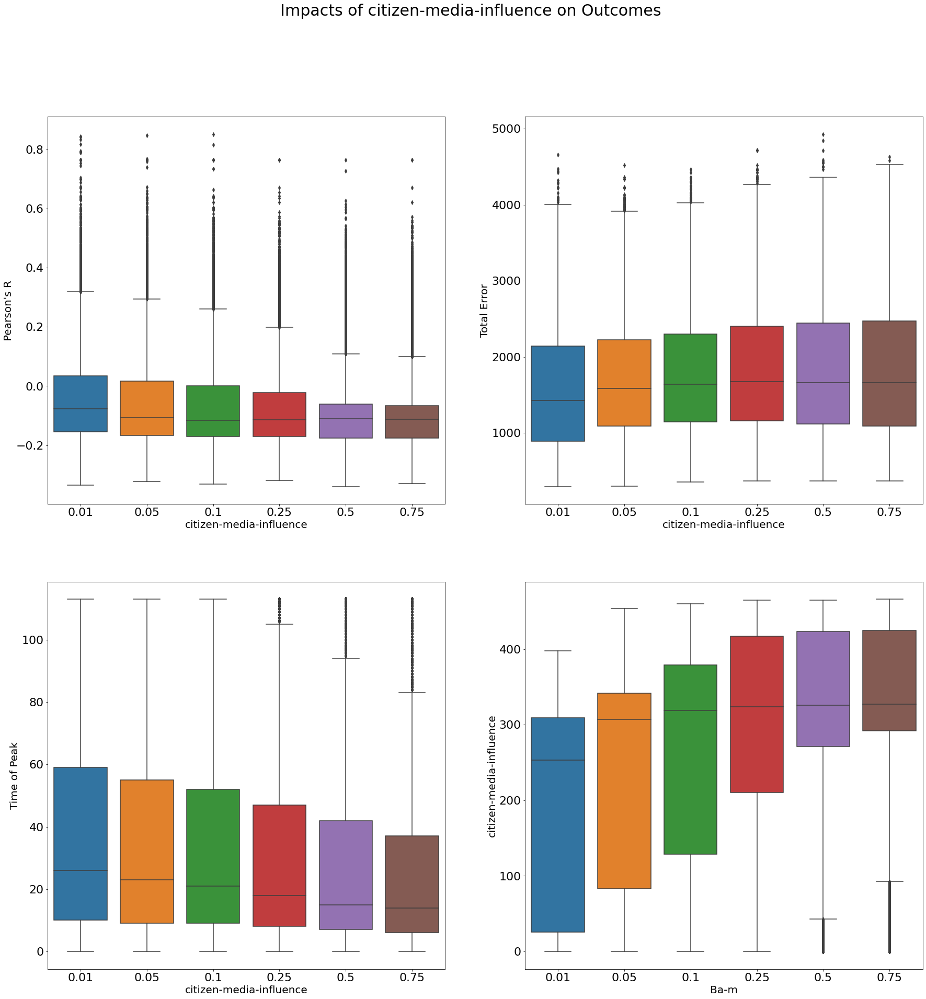

In [5]:
fig, axes=plt.subplots(2,2, figsize= (30,30))
fig.suptitle('Impacts of citizen-media-influence on Outcomes', fontsize=30)


sns.boxplot(ax=axes[0,1], data= org_mod, x='citizen-media-influence', y='total-error')
axes[0,1].set_xlabel("citizen-media-influence", fontsize=20)
axes[0,1].set_ylabel("Total Error", fontsize=20)
axes[0,1].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[0,0], data= org_mod, x='citizen-media-influence', y='r')
axes[0,0].set_xlabel("citizen-media-influence", fontsize=20)
axes[0,0].set_ylabel("Pearson's R", fontsize=20)
axes[0,0].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[1,0], data= org_mod, x='citizen-media-influence', y='peak-time')
axes[1,0].set_xlabel("citizen-media-influence", fontsize=20)
axes[1,0].set_ylabel("Time of Peak", fontsize=20)
axes[1,0].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[1,1], data= org_mod, x='citizen-media-influence', y='total-spread')
axes[1,1].set_xlabel("Ba-m", fontsize=20)
axes[1,1].set_ylabel("citizen-media-influence", fontsize=20)
axes[1,1].tick_params(axis='both', which='major', labelsize=22)

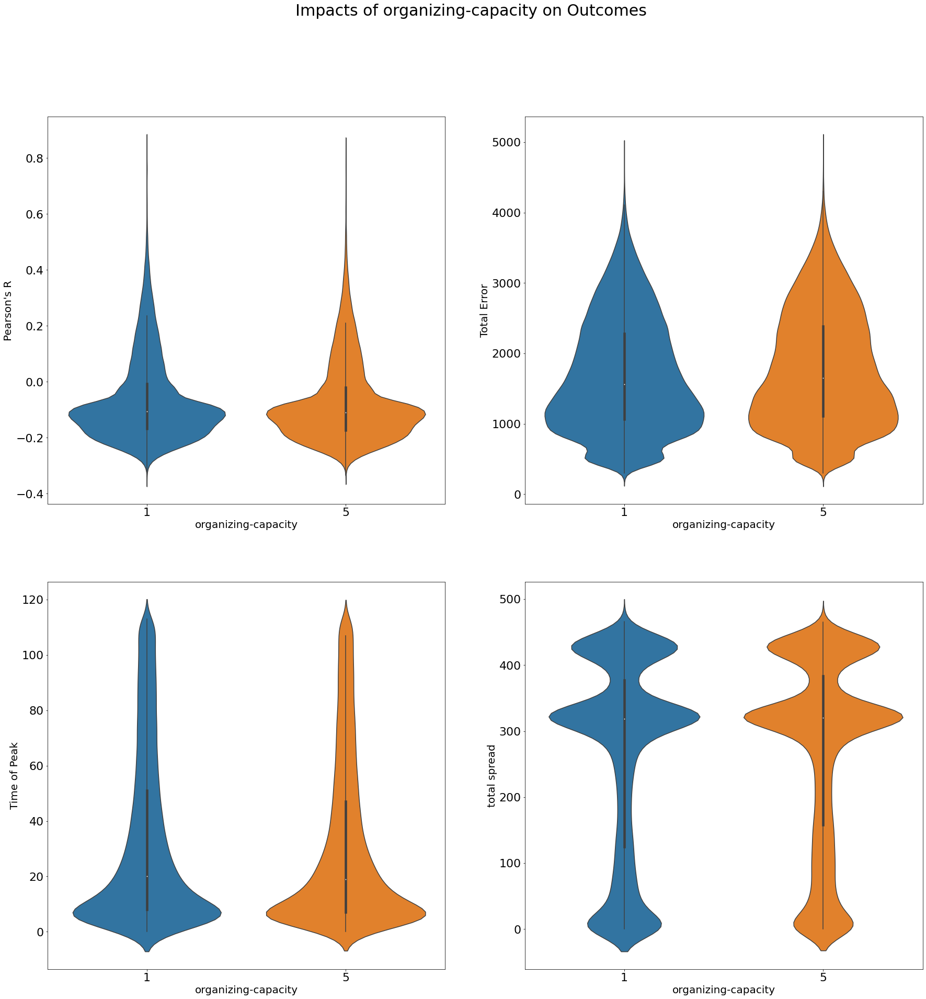

In [49]:
fig, axes=plt.subplots(2,2, figsize= (30,30))
fig.suptitle('Impacts of organizing-capacity on Outcomes', fontsize=30)


sns.violinplot(ax=axes[0,1], data= org_mod, x='organizing-capacity', y='total-error')
axes[0,1].set_xlabel("organizing-capacity", fontsize=20)
axes[0,1].set_ylabel("Total Error", fontsize=20)
axes[0,1].tick_params(axis='both', which='major', labelsize=22)

sns.violinplot(ax=axes[0,0], data= org_mod, x='organizing-capacity', y='r')
axes[0,0].set_xlabel("organizing-capacity", fontsize=20)
axes[0,0].set_ylabel("Pearson's R", fontsize=20)
axes[0,0].tick_params(axis='both', which='major', labelsize=22)

sns.violinplot(ax=axes[1,0], data= org_mod, x='organizing-capacity', y='peak-time')
axes[1,0].set_xlabel("organizing-capacity", fontsize=20)
axes[1,0].set_ylabel("Time of Peak", fontsize=20)
axes[1,0].tick_params(axis='both', which='major', labelsize=22)

sns.violinplot(ax=axes[1,1], data= org_mod, x='organizing-capacity', y='total-spread')
axes[1,1].set_xlabel("organizing-capacity", fontsize=20)
axes[1,1].set_ylabel("total spread", fontsize=20)
axes[1,1].tick_params(axis='both', which='major', labelsize=22)

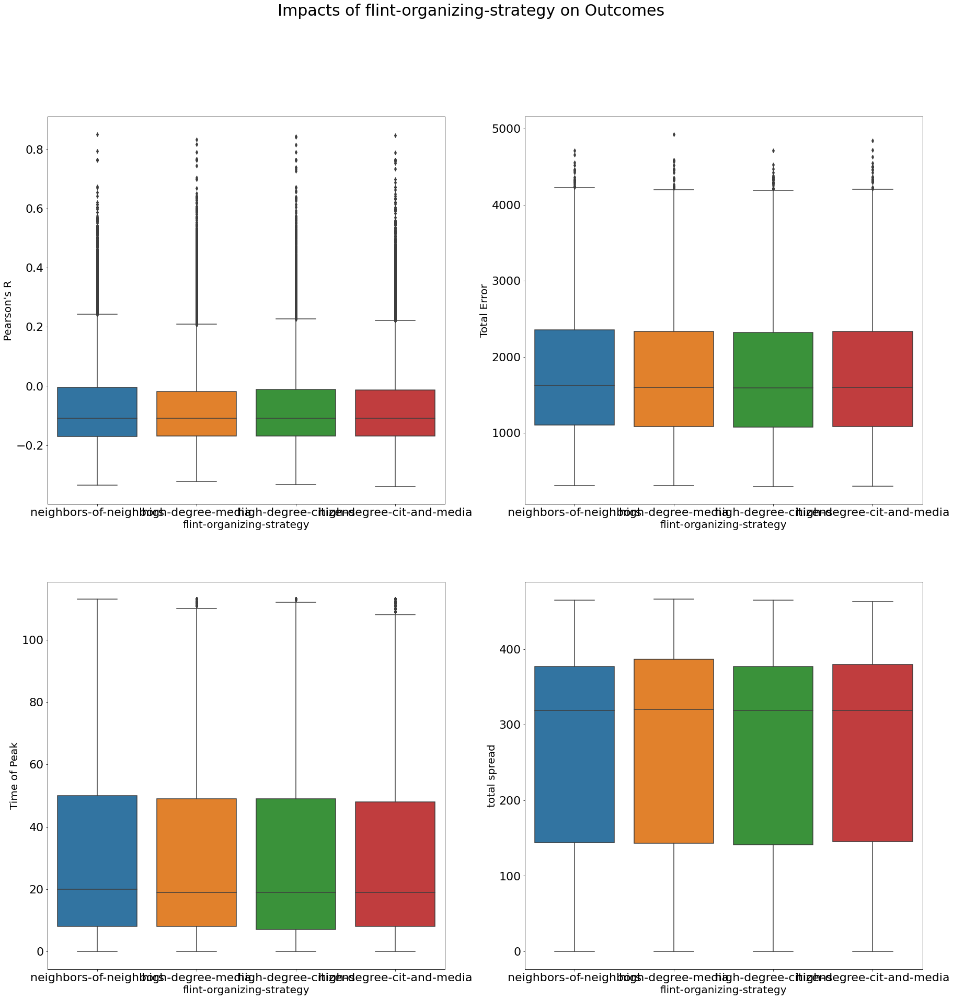

In [6]:
fig, axes=plt.subplots(2,2, figsize= (30,30))
fig.suptitle('Impacts of flint-organizing-strategy on Outcomes', fontsize=30)


sns.boxplot(ax=axes[0,1], data= org_mod, x='flint-organizing-strategy', y='total-error')
axes[0,1].set_xlabel("flint-organizing-strategy", fontsize=20)
axes[0,1].set_ylabel("Total Error", fontsize=20)
axes[0,1].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[0,0], data= org_mod, x='flint-organizing-strategy', y='r')
axes[0,0].set_xlabel("flint-organizing-strategy", fontsize=20)
axes[0,0].set_ylabel("Pearson's R", fontsize=20)
axes[0,0].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[1,0], data= org_mod, x='flint-organizing-strategy', y='peak-time')
axes[1,0].set_xlabel("flint-organizing-strategy", fontsize=20)
axes[1,0].set_ylabel("Time of Peak", fontsize=20)
axes[1,0].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[1,1], data= org_mod, x='flint-organizing-strategy', y='total-spread')
axes[1,1].set_xlabel("flint-organizing-strategy", fontsize=20)
axes[1,1].set_ylabel("total spread", fontsize=20)
axes[1,1].tick_params(axis='both', which='major', labelsize=22)

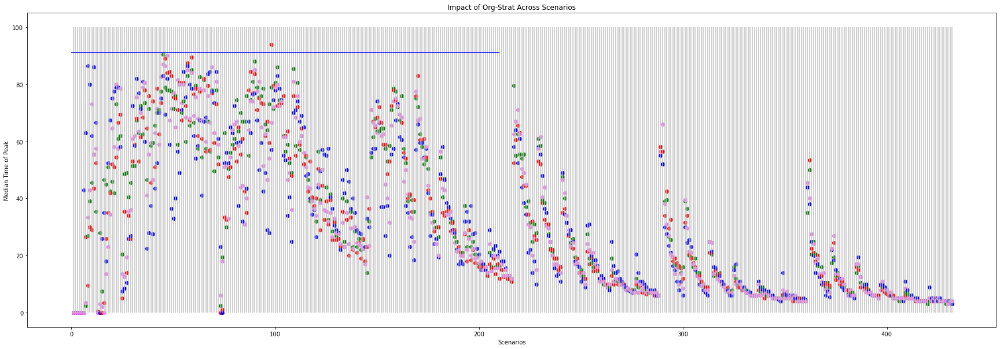

non 52
hdc 92
hdm 132
hdcm 43


In [21]:
import statistics
sweep = pd.read_csv("org_mod_with_metrics.csv")

g_data=pd.read_csv("google-trends.csv")
g_data.columns=['week', 'data']
goog_data= g_data['data'].to_list()

time_list=[]
for i in range(0, 114):
    time_list.append(i)

ba_m_list= [3,10]
p_list= [0.01, 0.05, 0.1, 0.25, 0.5, 0.75]
cit_cit_list= [0.01, 0.05, 0.1, 0.25, 0.5, 0.75]
cit_media_list = [0.01, 0.05, 0.1, 0.25, 0.5, 0.75]
org_cap_list = [1,5]
org_strat_list = ['neighbors-of-neighbors', 'high-degree-media', 'high-degree-citizens', 'high-degree-cit-and-media']

difference_list=[]

count_fastest_non = 0
count_fastest_hdm = 0
count_fastest_hdc = 0
count_fastest_hdcm = 0

plt.figure(figsize=(30,10))
i = 0
for j in range(0, len(p_list)):
    sweep_p = sweep.loc[sweep['simple-spread-chance'] == p_list[j]]
    for h in range(0, len(cit_cit_list)):
        sweep_c_c = sweep_p.loc[sweep_p["citizen-citizen-influence"] == cit_cit_list[h]]
        for k in range(0, len(cit_media_list)):
            sweep_c_m = sweep_c_c.loc[sweep_c_c["citizen-media-influence"] == cit_media_list[k]]
            for z in range(0, 2):
                sweep_oc = sweep_c_m.loc[sweep_c_m["organizing-capacity"] == org_cap_list[z]]
                non_runs = sweep_oc.loc[sweep_oc["flint-organizing-strategy"] == 'neighbors-of-neighbors']
                hdc_runs = sweep_oc.loc[sweep_oc["flint-organizing-strategy"] == 'high-degree-citizens']
                hdm_runs = sweep_oc.loc[sweep_oc["flint-organizing-strategy"] == 'high-degree-media']
                hdcm_runs = sweep_oc.loc[sweep_oc["flint-organizing-strategy"] == 'high-degree-cit-and-media']
                non_peak_time_list = []
                hdc_peak_time_list=[]
                hdm_peak_time_list=[]
                hdcm_peak_time_list=[]
                for a in range(0, len(non_runs)):  
                    peak_time = non_runs['peak-time'].iloc[a]
                    non_peak_time_list.append(peak_time)
                
                for b in range(0, len(hdc_runs)):  
                    peak_time = hdc_runs['peak-time'].iloc[b]
                    hdc_peak_time_list.append(peak_time)
                for c in range(0, len(hdm_runs)):  
                    peak_time = hdm_runs['peak-time'].iloc[c]
                    hdm_peak_time_list.append(peak_time)
                for d in range(0, len(hdcm_runs)):  
                    peak_time = hdcm_runs['peak-time'].iloc[d]
                    hdcm_peak_time_list.append(peak_time)
                #print(non_peak_time_list)  
                #print(z)
                non_med = statistics.median(non_peak_time_list)
                hdc_med = statistics.median(hdc_peak_time_list)
                hdm_med = statistics.median(hdm_peak_time_list)
                hdcm_med = statistics.median(hdcm_peak_time_list)
                if non_med < hdc_med and non_med< hdm_med and non_med < hdcm_med:
                    count_fastest_non = count_fastest_non + 1
                if hdc_med < non_med and hdc_med< hdm_med and hdc_med < hdcm_med:
                    count_fastest_hdc =  count_fastest_hdc + 1
                if hdm_med < hdc_med and hdm_med< non_med and hdm_med < hdcm_med:
                    count_fastest_hdm = count_fastest_hdm + 1
                if hdcm_med < hdc_med and hdcm_med< hdm_med and hdcm_med < non_med:
                    count_fastest_hdcm = count_fastest_hdcm + 1
                i = i + 1
            
            #plt.plot([i,i], [ba_3_med, ba_10_med])
                plt.scatter(i, non_med, c = 'green')
                plt.scatter(i, hdc_med, c = 'red')
                plt.scatter(i, hdm_med, c = 'blue')
                plt.scatter(i, hdcm_med, c = 'violet')
            
                plt.vlines(i, 0, 100, color = 'silver')
plt.hlines(91,0, 210, color = 'blue')
            
plt.title("Impact of Org-Strat Across Scenarios")
plt.ylabel('Median Time of Peak')
plt.xlabel('Scenarios')
plt.savefig("ba-m_scenario.png")
plt.show()

print('non', count_fastest_non)
print('hdc', count_fastest_hdc)
print('hdm', count_fastest_hdm)
print('hdcm', count_fastest_hdcm)



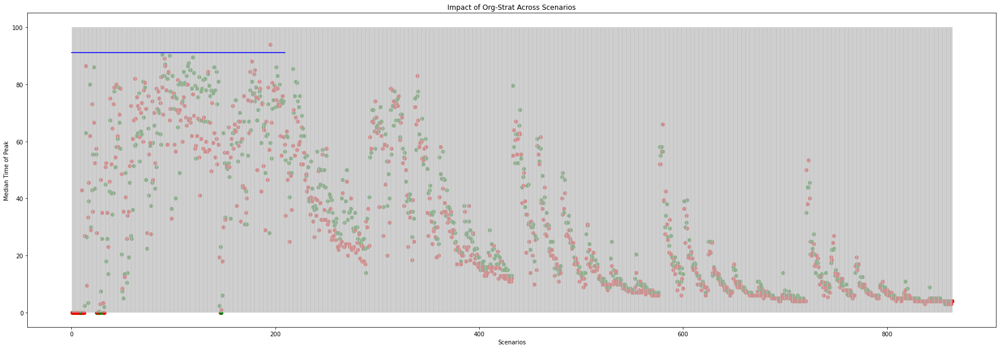

one 233
five 501


In [20]:
import statistics
sweep = pd.read_csv("org_mod_with_metrics.csv")

g_data=pd.read_csv("google-trends.csv")
g_data.columns=['week', 'data']
goog_data= g_data['data'].to_list()

time_list=[]
for i in range(0, 114):
    time_list.append(i)

ba_m_list= [3,10]
p_list= [0.01, 0.05, 0.1, 0.25, 0.5, 0.75]
cit_cit_list= [0.01, 0.05, 0.1, 0.25, 0.5, 0.75]
cit_media_list = [0.01, 0.05, 0.1, 0.25, 0.5, 0.75]
org_cap_list = [1,5]
org_strat_list = ['neighbors-of-neighbors', 'high-degree-media', 'high-degree-citizens', 'high-degree-cit-and-media']

difference_list=[]

count_fastest_one = 0
count_fastest_five = 0


plt.figure(figsize=(30,10))
i = 0
for j in range(0, len(p_list)):
    sweep_p = sweep.loc[sweep['simple-spread-chance'] == p_list[j]]
    for h in range(0, len(cit_cit_list)):
        sweep_c_c = sweep_p.loc[sweep_p["citizen-citizen-influence"] == cit_cit_list[h]]
        for k in range(0, len(cit_media_list)):
            sweep_c_m = sweep_c_c.loc[sweep_c_c["citizen-media-influence"] == cit_media_list[k]]
            for z in range(0, len(org_strat_list)):
                sweep_oc = sweep_c_m.loc[sweep_c_m["flint-organizing-strategy"] == org_strat_list[z]]
                one_runs = sweep_oc.loc[sweep_oc["organizing-capacity"] == 1]
                five_runs = sweep_oc.loc[sweep_oc["organizing-capacity"] == 5 ]
                one_peak_time_list = []
                five_peak_time_list=[]
                for a in range(0, len(one_runs)):  
                    peak_time = one_runs['peak-time'].iloc[a]
                    one_peak_time_list.append(peak_time)
                
                for b in range(0, len(five_runs)):  
                    peak_time = five_runs['peak-time'].iloc[b]
                    five_peak_time_list.append(peak_time)
                #print(non_peak_time_list)  
                #print(z)
                one_med = statistics.median(one_peak_time_list)
                five_med = statistics.median(five_peak_time_list)
                if one_med < five_med:
                    count_fastest_one = count_fastest_one + 1
                if five_med < one_med:
                    count_fastest_five =  count_fastest_five + 1
                i = i + 1
            
            #plt.plot([i,i], [ba_3_med, ba_10_med])
                plt.scatter(i, one_med, c = 'green')
                plt.scatter(i, five_med, c = 'red')

            
                plt.vlines(i, 0, 100, color = 'silver')
plt.hlines(91,0, 210, color = 'blue')
            
plt.title("Impact of Org-Strat Across Scenarios")
plt.ylabel('Median Time of Peak')
plt.xlabel('Scenarios')
plt.savefig("ba-m_scenario.png")
plt.show()

print('one', count_fastest_one)
print('five', count_fastest_five)



In [11]:
#the changes between these and their distributions seem to be pretty small- we can probably just approach these results as organizing vs non-organizing

      ba-m  simple-spread-chance  citizen-citizen-influence  \
0        3                  0.01                       0.01   
1        3                  0.01                       0.01   
2        3                  0.01                       0.01   
3        3                  0.01                       0.01   
4        3                  0.01                       0.01   
...    ...                   ...                        ...   
3451    10                  0.75                       0.75   
3452    10                  0.75                       0.75   
3453    10                  0.75                       0.75   
3454    10                  0.75                       0.75   
3455    10                  0.75                       0.75   

      citizen-media-influence  organizing-capacity  flint-organizing-strategy  \
0                        0.01                    1  high-degree-cit-and-media   
1                        0.01                    1       high-degree-citizens   


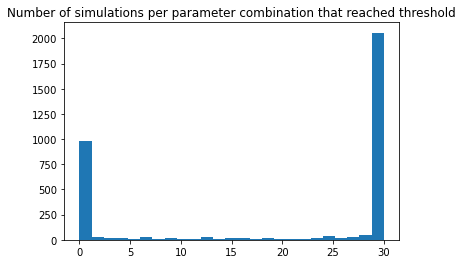

      ba-m  simple-spread-chance  citizen-citizen-influence  \
326      3                  0.05                       0.01   
330      3                  0.05                       0.01   
334      3                  0.05                       0.01   
372      3                  0.05                       0.05   
374      3                  0.05                       0.05   
...    ...                   ...                        ...   
3451    10                  0.75                       0.75   
3452    10                  0.75                       0.75   
3453    10                  0.75                       0.75   
3454    10                  0.75                       0.75   
3455    10                  0.75                       0.75   

      citizen-media-influence  organizing-capacity  flint-organizing-strategy  \
326                      0.50                    5          high-degree-media   
330                      0.75                    1          high-degree-media   


In [51]:
org_mod_thresh_count=org_mod.copy()
org_mod_thresh_count=org_mod_thresh_count.groupby(["ba-m", 'simple-spread-chance', 'citizen-citizen-influence', 'citizen-media-influence', 'organizing-capacity', 'flint-organizing-strategy'])['threshold'].sum().reset_index()
print(org_mod_thresh_count)

org_mod_thresh_count.to_csv("org_mod_thresh_count.csv")

plt.hist(org_mod_thresh_count["threshold"], bins=25)
plt.title('Number of simulations per parameter combination that reached threshold')
plt.show()

org_mod_thresh_count=org_mod_thresh_count.loc[org_mod_thresh_count['threshold']>=20]
print(org_mod_thresh_count)


In [53]:
org_mod['param-thresh']=None
for i in range(0, len(org_mod_thresh_count)):
    ba_m_val = org_mod_thresh_count['ba-m'].iloc[i]
    simple_spread_chance_val = org_mod_thresh_count['simple-spread-chance'].iloc[i]
    cit_cit_in_val = org_mod_thresh_count['citizen-citizen-influence'].iloc[i]
    cit_med_val = org_mod_thresh_count['citizen-media-influence'].iloc[i]
    org_cap = org_mod_thresh_count['organizing-capacity'].iloc[i]
    org_strat = org_mod_thresh_count['flint-organizing-strategy'].iloc[i]
    #print('next param setting',i)
    for j in range(0, len(org_mod)):
        if org_mod['ba-m'].iloc[j] == ba_m_val:
            if org_mod['simple-spread-chance'].iloc[j] == simple_spread_chance_val:
                if org_mod['citizen-citizen-influence'].iloc[j] == cit_cit_in_val:
                    if org_mod['citizen-media-influence'].iloc[j] == cit_med_val:
                        if org_mod["organizing-capacity"].iloc[i] == org_cap:
                            if org_mod["flint-organizing-strategy"].iloc[i] == org_strat:
                                org_mod['param-thresh'].iloc[j] = 1
                            else:
                                pass
                        else:
                            pass
                    else:
                        pass
                else:
                    pass
            else:
                pass
        else:
            pass

org_mod.to_csv('org_mod_with_param_thresh.csv')            
#print(org_mod)
    

next param setting 0
next param setting 1
next param setting 2
next param setting 3
next param setting 4
next param setting 5
next param setting 6
next param setting 7
next param setting 8
next param setting 9
next param setting 10
next param setting 11
next param setting 12
next param setting 13
next param setting 14
next param setting 15


C:\Users\cknox\anaconda3\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



next param setting 16
next param setting 17
next param setting 18
next param setting 19
next param setting 20
next param setting 21
next param setting 22
next param setting 23
next param setting 24
next param setting 25
next param setting 26
next param setting 27
next param setting 28
next param setting 29
next param setting 30
next param setting 31
next param setting 32
next param setting 33
next param setting 34
next param setting 35
next param setting 36
next param setting 37
next param setting 38
next param setting 39
next param setting 40
next param setting 41
next param setting 42
next param setting 43
next param setting 44
next param setting 45
next param setting 46
next param setting 47
next param setting 48
next param setting 49
next param setting 50
next param setting 51
next param setting 52
next param setting 53
next param setting 54
next param setting 55
next param setting 56
next param setting 57
next param setting 58
next param setting 59
next param setting 60
next param

next param setting 376
next param setting 377
next param setting 378
next param setting 379
next param setting 380
next param setting 381
next param setting 382
next param setting 383
next param setting 384
next param setting 385
next param setting 386
next param setting 387
next param setting 388
next param setting 389
next param setting 390
next param setting 391
next param setting 392
next param setting 393
next param setting 394
next param setting 395
next param setting 396
next param setting 397
next param setting 398
next param setting 399
next param setting 400
next param setting 401
next param setting 402
next param setting 403
next param setting 404
next param setting 405
next param setting 406
next param setting 407
next param setting 408
next param setting 409
next param setting 410
next param setting 411
next param setting 412
next param setting 413
next param setting 414
next param setting 415
next param setting 416
next param setting 417
next param setting 418
next param 

next param setting 733
next param setting 734
next param setting 735
next param setting 736
next param setting 737
next param setting 738
next param setting 739
next param setting 740
next param setting 741
next param setting 742
next param setting 743
next param setting 744
next param setting 745
next param setting 746
next param setting 747
next param setting 748
next param setting 749
next param setting 750
next param setting 751
next param setting 752
next param setting 753
next param setting 754
next param setting 755
next param setting 756
next param setting 757
next param setting 758
next param setting 759
next param setting 760
next param setting 761
next param setting 762
next param setting 763
next param setting 764
next param setting 765
next param setting 766
next param setting 767
next param setting 768
next param setting 769
next param setting 770
next param setting 771
next param setting 772
next param setting 773
next param setting 774
next param setting 775
next param 

next param setting 1086
next param setting 1087
next param setting 1088
next param setting 1089
next param setting 1090
next param setting 1091
next param setting 1092
next param setting 1093
next param setting 1094
next param setting 1095
next param setting 1096
next param setting 1097
next param setting 1098
next param setting 1099
next param setting 1100
next param setting 1101
next param setting 1102
next param setting 1103
next param setting 1104
next param setting 1105
next param setting 1106
next param setting 1107
next param setting 1108
next param setting 1109
next param setting 1110
next param setting 1111
next param setting 1112
next param setting 1113
next param setting 1114
next param setting 1115
next param setting 1116
next param setting 1117
next param setting 1118
next param setting 1119
next param setting 1120
next param setting 1121
next param setting 1122
next param setting 1123
next param setting 1124
next param setting 1125
next param setting 1126
next param setti

next param setting 1428
next param setting 1429
next param setting 1430
next param setting 1431
next param setting 1432
next param setting 1433
next param setting 1434
next param setting 1435
next param setting 1436
next param setting 1437
next param setting 1438
next param setting 1439
next param setting 1440
next param setting 1441
next param setting 1442
next param setting 1443
next param setting 1444
next param setting 1445
next param setting 1446
next param setting 1447
next param setting 1448
next param setting 1449
next param setting 1450
next param setting 1451
next param setting 1452
next param setting 1453
next param setting 1454
next param setting 1455
next param setting 1456
next param setting 1457
next param setting 1458
next param setting 1459
next param setting 1460
next param setting 1461
next param setting 1462
next param setting 1463
next param setting 1464
next param setting 1465
next param setting 1466
next param setting 1467
next param setting 1468
next param setti

next param setting 1770
next param setting 1771
next param setting 1772
next param setting 1773
next param setting 1774
next param setting 1775
next param setting 1776
next param setting 1777
next param setting 1778
next param setting 1779
next param setting 1780
next param setting 1781
next param setting 1782
next param setting 1783
next param setting 1784
next param setting 1785
next param setting 1786
next param setting 1787
next param setting 1788
next param setting 1789
next param setting 1790
next param setting 1791
next param setting 1792
next param setting 1793
next param setting 1794
next param setting 1795
next param setting 1796
next param setting 1797
next param setting 1798
next param setting 1799
next param setting 1800
next param setting 1801
next param setting 1802
next param setting 1803
next param setting 1804
next param setting 1805
next param setting 1806
next param setting 1807
next param setting 1808
next param setting 1809
next param setting 1810
next param setti

next param setting 2112
next param setting 2113
next param setting 2114
next param setting 2115
next param setting 2116
next param setting 2117
next param setting 2118
next param setting 2119
next param setting 2120
next param setting 2121
next param setting 2122
next param setting 2123
next param setting 2124
next param setting 2125
next param setting 2126
next param setting 2127
next param setting 2128
next param setting 2129
next param setting 2130
next param setting 2131
next param setting 2132
next param setting 2133
next param setting 2134
next param setting 2135
next param setting 2136
next param setting 2137
next param setting 2138
next param setting 2139
next param setting 2140
next param setting 2141
next param setting 2142
next param setting 2143
next param setting 2144
next param setting 2145
next param setting 2146
next param setting 2147
next param setting 2148
next param setting 2149
next param setting 2150
next param setting 2151
next param setting 2152
next param setti

In [33]:
#this code will limit the dataframe to those who have passed our threshold calculations
org_mod=org_mod.loc[org_mod['param-thresh'] == 1]

#infl_mod is now a dataframe of all simulations within parameter combinations where the threshold of 70% spread was passed 20/25 times
#now we can sort by the median peak-time value (the metric that best represents our question)
org_mod_time_median=org_mod.copy()
org_mod_time_median=org_mod_time_median.groupby(["ba-m", 'simple-spread-chance', 'citizen-citizen-influence', 'citizen-media-influence'])['peak-time'].median().reset_index()
print(org_mod_time_median)

org_mod_time_median.to_csv("org_mod_time_median.csv")






     ba-m  simple-spread-chance  citizen-citizen-influence  \
0       3                  0.05                       0.01   
1       3                  0.05                       0.01   
2       3                  0.05                       0.05   
3       3                  0.05                       0.05   
4       3                  0.05                       0.10   
..    ...                   ...                        ...   
306    10                  0.75                       0.75   
307    10                  0.75                       0.75   
308    10                  0.75                       0.75   
309    10                  0.75                       0.75   
310    10                  0.75                       0.75   

     citizen-media-influence  peak-time  
0                       0.50       51.5  
1                       0.75       47.5  
2                       0.50       72.0  
3                       0.75       62.0  
4                       0.25       77.0  
.. 

In [34]:
#Now I will take a look at the top hits here,  using the dataframe previously saved as a csv so we don't have to regenerate it
#this will generate the top 20 parameter combinations
df=pd.read_csv("org_mod_with_param_thresh.csv")
#old method for this

g_data=pd.read_csv("google-trends.csv")
g_data.columns=['week', 'data']
goog_data= g_data['data'].to_list()

time_list=[]
for i in range(0, 114):
    time_list.append(i)

In [14]:
#all rows
org_mod_time_median= pd.read_csv("org_mod_time_median.csv")
for i in range(0, 114):
    ba_m_val = org_mod_time_median['ba-m'].iloc[i]
    p_ = org_mod_time_median['simple-spread-chance'].iloc[i]
    cit_cit = org_mod_time_median['citizen-citizen-influence'].iloc[i]
    cit_media = org_mod_time_median['citizen-media-influence'].iloc[i]
    data_1= df.loc[df['ba-m']==ba_m_val]
    data_1=data_1.loc[data_1['simple-spread-chance']==p_]
    data_1=data_1.loc[data_1['citizen-citizen-influence']==cit_cit]
    data_1=data_1.loc[data_1['citizen-media-influence']==cit_media]
    for j in range(0, 114):
        data=data_1['short list'].iloc[j]
        data_list=data.strip('][').split(', ')
        new_list=[]
        for j in range(0, len(data_list)):
            item=float(data_list[j])
            new_list.append(item)
        val=i
  #      plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False, labelsize=20)
  #      plt.plot(time_list, new_list, color='red')
    

  #  plt.plot(time_list, goog_data, color='blue', lw=3, label="google")
  #  plt.legend()
  #  plt.title(i, fontsize=20)
  #  plt.show()


In [15]:
org_mod_thresh_count=org_mod.copy()
org_mod_time_count=org_mod_thresh_count.groupby(["ba-m", 'simple-spread-chance', 'citizen-citizen-influence', 'citizen-media-influence'])['peak-time'].median().reset_index()
print(org_mod_time_count)


df=pd.read_csv("org_mod_with_metrics.csv")
#old method for this

g_data=pd.read_csv("google-trends.csv")
g_data.columns=['week', 'data']
goog_data= g_data['data'].to_list()

time_list=[]
for i in range(0, 114):
    time_list.append(i)
#infl_mod_thresh_count=infl_mod_thresh_count.loc[infl_mod_thresh_count['threshold']>=20]

org_mod_time_median= org_mod_time_count
for i in range(0, len(org_mod_time_median)):
    ba_m_val = org_mod_time_median['ba-m'].iloc[i]
    p_ = org_mod_time_median['simple-spread-chance'].iloc[i]
    cit_cit = org_mod_time_median['citizen-citizen-influence'].iloc[i]
    cit_media = org_mod_time_median['citizen-media-influence'].iloc[i]
    data_1= df.loc[df['ba-m']==ba_m_val]
    data_1=data_1.loc[data_1['simple-spread-chance']==p_]
    data_1=data_1.loc[data_1['citizen-citizen-influence']==cit_cit]
    data_1=data_1.loc[data_1['citizen-media-influence']==cit_media]
    plt.figure(figsize=(30,10))
    for j in range(0, len(data_1)):
        data=data_1['unscaled-list'].iloc[j]
        data_list=data.strip('][').split(', ')
        new_list=[]
        for j in range(0, len(data_list)):
            item=float(data_list[j])
            new_list.append(item)
        val=i
        
        plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False, labelsize=20)
        plt.plot(time_list, new_list, color='red')
    plt.vlines(91, 0, 50, color = 'blue')

#    plt.title(i, fontsize=20)
#    plt.show()

NameError: name 'org_mod' is not defined

In [ ]:
#How do these compare to earlier- lets look at the specific run from earlier that had a lot of hits


In [16]:
# run 420
df=pd.read_csv("org_mod_with_metrics.csv")
g_data=pd.read_csv("google-trends.csv")
g_data.columns=['week', 'data']
goog_data= g_data['data'].to_list()

time_list=[]
for i in range(0, 114):
    time_list.append(i)
data_1= df.loc[df['ba-m']==10]
data_1=data_1.loc[data_1['simple-spread-chance']==0.75]
data_1=data_1.loc[data_1['citizen-citizen-influence']==0.5]
data_1=data_1.loc[data_1['citizen-media-influence']==0.01]

for i in range(0, len(data_1)):
    data=data_1['short list'].iloc[i]
    data_list=data.strip('][').split(', ')
    new_list=[]
    for j in range(0, len(data_list)):
        item=float(data_list[j])
        new_list.append(item)
    val=i
#    plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False)
#    plt.plot(time_list, new_list, color='red')
#    plt.plot(time_list, goog_data, color='blue', lw=3, label="google")
#    plt.legend()
#    plt.title(i)
#    plt.show()
    
    
    #no hits- not surprising since organizing should make the peak occur earlier

In [17]:
#what if we plot both?
# run 420
df_org=pd.read_csv("org_mod_with_metrics.csv")
df_infl=pd.read_csv("influence_mod_with_metrics.csv")
g_data=pd.read_csv("google-trends.csv")
g_data.columns=['week', 'data']
goog_data= g_data['data'].to_list()
plt.figure(figsize = (30,10))

time_list=[]
for i in range(0, 114):
    time_list.append(i)
data_1= df_infl.loc[df_infl['ba-m']==10]
data_1=data_1.loc[data_1['simple-spread-chance']==0.75]
data_1=data_1.loc[data_1['citizen-citizen-influence']==0.5]
data_1=data_1.loc[data_1['citizen-media-influence']==0.01]

time_list=[]
for i in range(0, 114):
    time_list.append(i)
data_2= df_org.loc[df_org['ba-m']==10]
data_2=data_2.loc[data_2['simple-spread-chance']==0.75]
data_2=data_2.loc[data_2['citizen-citizen-influence']==0.5]
data_2=data_2.loc[data_2['citizen-media-influence']==0.01]

for i in range(0, len(data_1)):
    data=data_1['short list'].iloc[i]
    data_list=data.strip('][').split(', ')
    new_list=[]
    for k in range(0, len(data_list)):
        item=float(data_list[k])
        new_list.append(item)
    val=i
#    plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False)
#    plt.plot(time_list, new_list, color='red')
    if i == 1:
#        plt.plot(time_list, new_list, color = 'red', label = 'no-organizing')

for j in range(0, len(data_2)):
    data=data_2['short list'].iloc[j]
    data_list=data.strip('][').split(', ')
    new_list=[]
    for l in range(0, len(data_list)):
        item=float(data_list[l])
        new_list.append(item)
    val=i
#    plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False)
#    plt.plot(time_list, new_list, color='green')
    if j == 1:
#        plt.plot(time_list, new_list, color = 'green', label = 'organizing')
    
    
#plt.plot(time_list, goog_data, color='blue', lw=3, label="google")
#plt.legend()
#plt.title("10, 0.75, 0.5, 0.01")
#plt.show()


IndentationError: expected an indented block (Temp/ipykernel_22932/161562078.py, line 39)

In [18]:
#lets break this into each strat/cap combo
#plt.figure(figsize=(10,5))


for i in range(0, 114):
    time_list.append(i)
data_1= df_infl.loc[df_infl['ba-m']==10]
data_1=data_1.loc[data_1['simple-spread-chance']==0.75]
data_1=data_1.loc[data_1['citizen-citizen-influence']==0.5]
data_1=data_1.loc[data_1['citizen-media-influence']==0.01]

time_list=[]
for i in range(0, 114):
    time_list.append(i)
data_2= df_org.loc[df_org['ba-m']==10]
data_2=data_2.loc[data_2['simple-spread-chance']==0.75]
data_2=data_2.loc[data_2['citizen-citizen-influence']==0.5]
data_2=data_2.loc[data_2['citizen-media-influence']==0.01]
data_2=data_2.loc[data_2['organizing-capacity']==1]
data_2=data_2.loc[data_2['flint-organizing-strategy']=='neighbors-of-neighbors']

for i in range(0, len(data_1)):
    data=data_1['short list'].iloc[i]
    data_list=data.strip('][').split(', ')
    new_list=[]
    for k in range(0, len(data_list)):
        item=float(data_list[k])
        new_list.append(item)
    val=i
#    plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False)
#    plt.plot(time_list, new_list, color='red')

for j in range(0, len(data_2)):
    data=data_2['short list'].iloc[j]
    data_list=data.strip('][').split(', ')
    new_list=[]
    for l in range(0, len(data_list)):
        item=float(data_list[l])
        new_list.append(item)
    val=i
#    plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False)
#    plt.plot(time_list, new_list, color='green')
    
    
#plt.plot(time_list, goog_data, color='blue', lw=3, label="google")
#plt.legend()
#plt.title("10, 0.75, 0.5, 0.01, 1, NoN")
#plt.show()


NameError: name 'df_infl' is not defined

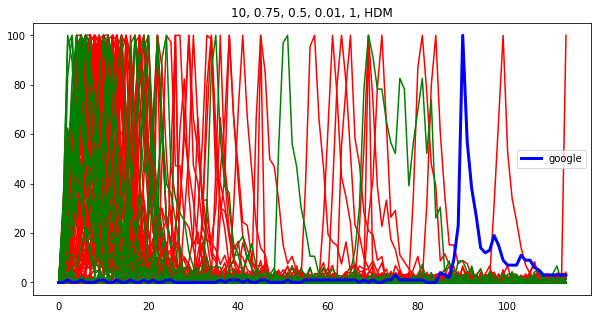

In [32]:
#lets break this into each strat/cap combo
plt.figure(figsize=(10,5))

for i in range(0, 114):
    time_list.append(i)
data_1= df_infl.loc[df_infl['ba-m']==10]
data_1=data_1.loc[data_1['simple-spread-chance']==0.75]
data_1=data_1.loc[data_1['citizen-citizen-influence']==0.5]
data_1=data_1.loc[data_1['citizen-media-influence']==0.01]

time_list=[]
for i in range(0, 114):
    time_list.append(i)
data_2= df_org.loc[df_org['ba-m']==10]
data_2=data_2.loc[data_2['simple-spread-chance']==0.75]
data_2=data_2.loc[data_2['citizen-citizen-influence']==0.5]
data_2=data_2.loc[data_2['citizen-media-influence']==0.01]
data_2=data_2.loc[data_2['organizing-capacity']==1]
data_2=data_2.loc[data_2['flint-organizing-strategy']=='high-degree-media']

for i in range(0, len(data_1)):
    data=data_1['short list'].iloc[i]
    data_list=data.strip('][').split(', ')
    new_list=[]
    for k in range(0, len(data_list)):
        item=float(data_list[k])
        new_list.append(item)
    val=i
    plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False)
    plt.plot(time_list, new_list, color='red')

for j in range(0, len(data_2)):
    data=data_2['short list'].iloc[j]
    data_list=data.strip('][').split(', ')
    new_list=[]
    for l in range(0, len(data_list)):
        item=float(data_list[l])
        new_list.append(item)
    val=i
    plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False)
    plt.plot(time_list, new_list, color='green')
    
    
plt.plot(time_list, goog_data, color='blue', lw=3, label="google")
plt.legend()
plt.title("10, 0.75, 0.5, 0.01, 1, HDM")
plt.show()


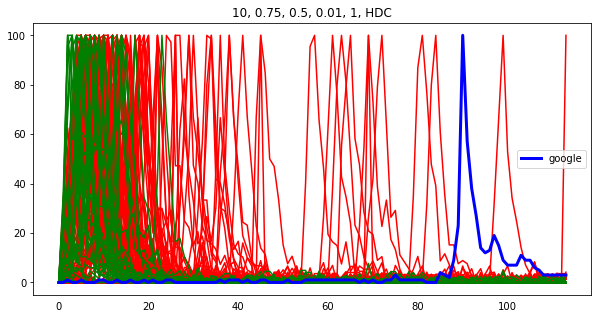

In [33]:
#lets break this into each strat/cap combo
plt.figure(figsize=(10,5))

for i in range(0, 114):
    time_list.append(i)
data_1= df_infl.loc[df_infl['ba-m']==10]
data_1=data_1.loc[data_1['simple-spread-chance']==0.75]
data_1=data_1.loc[data_1['citizen-citizen-influence']==0.5]
data_1=data_1.loc[data_1['citizen-media-influence']==0.01]

time_list=[]
for i in range(0, 114):
    time_list.append(i)
data_2= df_org.loc[df_org['ba-m']==10]
data_2=data_2.loc[data_2['simple-spread-chance']==0.75]
data_2=data_2.loc[data_2['citizen-citizen-influence']==0.5]
data_2=data_2.loc[data_2['citizen-media-influence']==0.01]
data_2=data_2.loc[data_2['organizing-capacity']==1]
data_2=data_2.loc[data_2['flint-organizing-strategy']=='high-degree-citizens']

for i in range(0, len(data_1)):
    data=data_1['short list'].iloc[i]
    data_list=data.strip('][').split(', ')
    new_list=[]
    for k in range(0, len(data_list)):
        item=float(data_list[k])
        new_list.append(item)
    val=i
    plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False)
    plt.plot(time_list, new_list, color='red')

for j in range(0, len(data_2)):
    data=data_2['short list'].iloc[j]
    data_list=data.strip('][').split(', ')
    new_list=[]
    for l in range(0, len(data_list)):
        item=float(data_list[l])
        new_list.append(item)
    val=i
    plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False)
    plt.plot(time_list, new_list, color='green')
    
    
plt.plot(time_list, goog_data, color='blue', lw=3, label="google")
plt.legend()
plt.title("10, 0.75, 0.5, 0.01, 1, HDC")
plt.show()


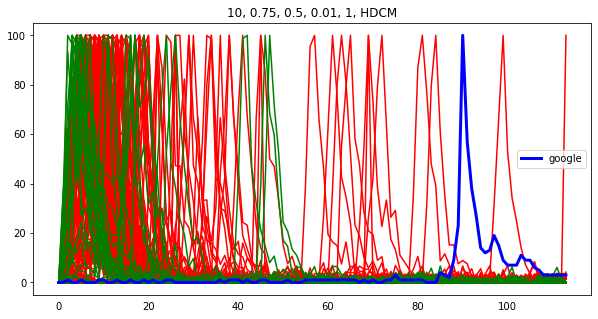

In [34]:
#lets break this into each strat/cap combo
plt.figure(figsize=(10,5))


for i in range(0, 114):
    time_list.append(i)
data_1= df_infl.loc[df_infl['ba-m']==10]
data_1=data_1.loc[data_1['simple-spread-chance']==0.75]
data_1=data_1.loc[data_1['citizen-citizen-influence']==0.5]
data_1=data_1.loc[data_1['citizen-media-influence']==0.01]

time_list=[]
for i in range(0, 114):
    time_list.append(i)
data_2= df_org.loc[df_org['ba-m']==10]
data_2=data_2.loc[data_2['simple-spread-chance']==0.75]
data_2=data_2.loc[data_2['citizen-citizen-influence']==0.5]
data_2=data_2.loc[data_2['citizen-media-influence']==0.01]
data_2=data_2.loc[data_2['organizing-capacity']==1]
data_2=data_2.loc[data_2['flint-organizing-strategy']=='high-degree-cit-and-media']

for i in range(0, len(data_1)):
    data=data_1['short list'].iloc[i]
    data_list=data.strip('][').split(', ')
    new_list=[]
    for k in range(0, len(data_list)):
        item=float(data_list[k])
        new_list.append(item)
    val=i
    plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False)
    plt.plot(time_list, new_list, color='red')

for j in range(0, len(data_2)):
    data=data_2['short list'].iloc[j]
    data_list=data.strip('][').split(', ')
    new_list=[]
    for l in range(0, len(data_list)):
        item=float(data_list[l])
        new_list.append(item)
    val=i
    plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False)
    plt.plot(time_list, new_list, color='green')
    
    
plt.plot(time_list, goog_data, color='blue', lw=3, label="google")
plt.legend()
plt.title("10, 0.75, 0.5, 0.01, 1, HDCM")
plt.show()


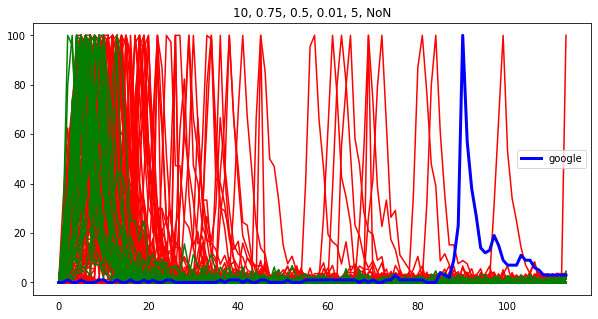

In [35]:
#lets break this into each strat/cap combo
plt.figure(figsize=(10,5))


for i in range(0, 114):
    time_list.append(i)
data_1= df_infl.loc[df_infl['ba-m']==10]
data_1=data_1.loc[data_1['simple-spread-chance']==0.75]
data_1=data_1.loc[data_1['citizen-citizen-influence']==0.5]
data_1=data_1.loc[data_1['citizen-media-influence']==0.01]

time_list=[]
for i in range(0, 114):
    time_list.append(i)
data_2= df_org.loc[df_org['ba-m']==10]
data_2=data_2.loc[data_2['simple-spread-chance']==0.75]
data_2=data_2.loc[data_2['citizen-citizen-influence']==0.5]
data_2=data_2.loc[data_2['citizen-media-influence']==0.01]
data_2=data_2.loc[data_2['organizing-capacity']==5]
data_2=data_2.loc[data_2['flint-organizing-strategy']=='neighbors-of-neighbors']

for i in range(0, len(data_1)):
    data=data_1['short list'].iloc[i]
    data_list=data.strip('][').split(', ')
    new_list=[]
    for k in range(0, len(data_list)):
        item=float(data_list[k])
        new_list.append(item)
    val=i
    plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False)
    plt.plot(time_list, new_list, color='red')

for j in range(0, len(data_2)):
    data=data_2['short list'].iloc[j]
    data_list=data.strip('][').split(', ')
    new_list=[]
    for l in range(0, len(data_list)):
        item=float(data_list[l])
        new_list.append(item)
    val=i
    plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False)
    plt.plot(time_list, new_list, color='green')
    
    
plt.plot(time_list, goog_data, color='blue', lw=3, label="google")
plt.legend()
plt.title("10, 0.75, 0.5, 0.01, 5, NoN")
plt.show()


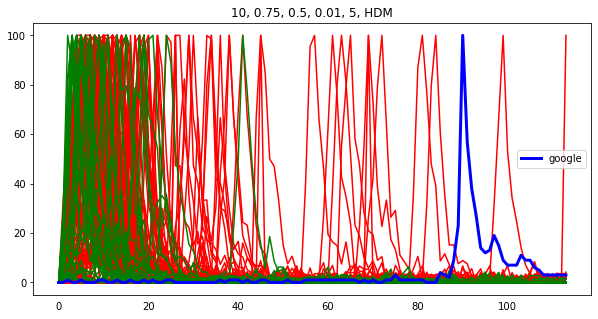

In [36]:
#lets break this into each strat/cap combo
plt.figure(figsize=(10,5))

for i in range(0, 114):
    time_list.append(i)
data_1= df_infl.loc[df_infl['ba-m']==10]
data_1=data_1.loc[data_1['simple-spread-chance']==0.75]
data_1=data_1.loc[data_1['citizen-citizen-influence']==0.5]
data_1=data_1.loc[data_1['citizen-media-influence']==0.01]

time_list=[]
for i in range(0, 114):
    time_list.append(i)
data_2= df_org.loc[df_org['ba-m']==10]
data_2=data_2.loc[data_2['simple-spread-chance']==0.75]
data_2=data_2.loc[data_2['citizen-citizen-influence']==0.5]
data_2=data_2.loc[data_2['citizen-media-influence']==0.01]
data_2=data_2.loc[data_2['organizing-capacity']==5]
data_2=data_2.loc[data_2['flint-organizing-strategy']=='high-degree-media']

for i in range(0, len(data_1)):
    data=data_1['short list'].iloc[i]
    data_list=data.strip('][').split(', ')
    new_list=[]
    for k in range(0, len(data_list)):
        item=float(data_list[k])
        new_list.append(item)
    val=i
    plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False)
    plt.plot(time_list, new_list, color='red')

for j in range(0, len(data_2)):
    data=data_2['short list'].iloc[j]
    data_list=data.strip('][').split(', ')
    new_list=[]
    for l in range(0, len(data_list)):
        item=float(data_list[l])
        new_list.append(item)
    val=i
    plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False)
    plt.plot(time_list, new_list, color='green')
    
    
plt.plot(time_list, goog_data, color='blue', lw=3, label="google")
plt.legend()
plt.title("10, 0.75, 0.5, 0.01, 5, HDM")
plt.show()


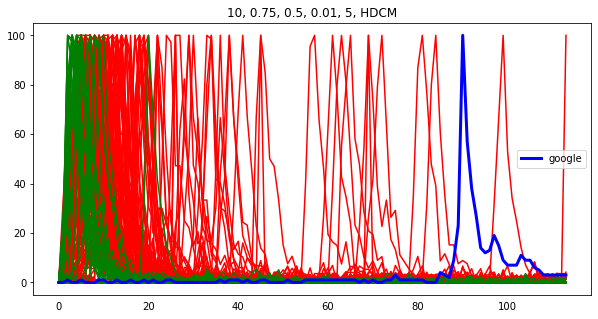

In [38]:
#lets break this into each strat/cap combo
plt.figure(figsize=(10,5))


for i in range(0, 114):
    time_list.append(i)
data_1= df_infl.loc[df_infl['ba-m']==10]
data_1=data_1.loc[data_1['simple-spread-chance']==0.75]
data_1=data_1.loc[data_1['citizen-citizen-influence']==0.5]
data_1=data_1.loc[data_1['citizen-media-influence']==0.01]

time_list=[]
for i in range(0, 114):
    time_list.append(i)
data_2= df_org.loc[df_org['ba-m']==10]
data_2=data_2.loc[data_2['simple-spread-chance']==0.75]
data_2=data_2.loc[data_2['citizen-citizen-influence']==0.5]
data_2=data_2.loc[data_2['citizen-media-influence']==0.01]
data_2=data_2.loc[data_2['organizing-capacity']==5]
data_2=data_2.loc[data_2['flint-organizing-strategy']=='high-degree-cit-and-media']

for i in range(0, len(data_1)):
    data=data_1['short list'].iloc[i]
    data_list=data.strip('][').split(', ')
    new_list=[]
    for k in range(0, len(data_list)):
        item=float(data_list[k])
        new_list.append(item)
    val=i
    plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False)
    plt.plot(time_list, new_list, color='red')

for j in range(0, len(data_2)):
    data=data_2['short list'].iloc[j]
    data_list=data.strip('][').split(', ')
    new_list=[]
    for l in range(0, len(data_list)):
        item=float(data_list[l])
        new_list.append(item)
    val=i
    plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False)
    plt.plot(time_list, new_list, color='green')
    
    
plt.plot(time_list, goog_data, color='blue', lw=3, label="google")
plt.legend()
plt.title("10, 0.75, 0.5, 0.01, 5, HDCM")
plt.show()


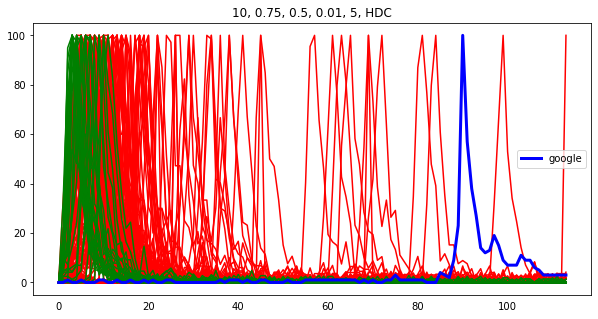

In [39]:
#lets break this into each strat/cap combo
plt.figure(figsize=(10,5))

for i in range(0, 114):
    time_list.append(i)
data_1= df_infl.loc[df_infl['ba-m']==10]
data_1=data_1.loc[data_1['simple-spread-chance']==0.75]
data_1=data_1.loc[data_1['citizen-citizen-influence']==0.5]
data_1=data_1.loc[data_1['citizen-media-influence']==0.01]

time_list=[]
for i in range(0, 114):
    time_list.append(i)
data_2= df_org.loc[df_org['ba-m']==10]
data_2=data_2.loc[data_2['simple-spread-chance']==0.75]
data_2=data_2.loc[data_2['citizen-citizen-influence']==0.5]
data_2=data_2.loc[data_2['citizen-media-influence']==0.01]
data_2=data_2.loc[data_2['organizing-capacity']==5]
data_2=data_2.loc[data_2['flint-organizing-strategy']=='high-degree-citizens']

for i in range(0, len(data_1)):
    data=data_1['short list'].iloc[i]
    data_list=data.strip('][').split(', ')
    new_list=[]
    for k in range(0, len(data_list)):
        item=float(data_list[k])
        new_list.append(item)
    val=i
    plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False)
    plt.plot(time_list, new_list, color='red')

for j in range(0, len(data_2)):
    data=data_2['short list'].iloc[j]
    data_list=data.strip('][').split(', ')
    new_list=[]
    for l in range(0, len(data_list)):
        item=float(data_list[l])
        new_list.append(item)
    val=i
    plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False)
    plt.plot(time_list, new_list, color='green')
    
    
plt.plot(time_list, goog_data, color='blue', lw=3, label="google")
plt.legend()
plt.title("10, 0.75, 0.5, 0.01, 5, HDC")
plt.show()

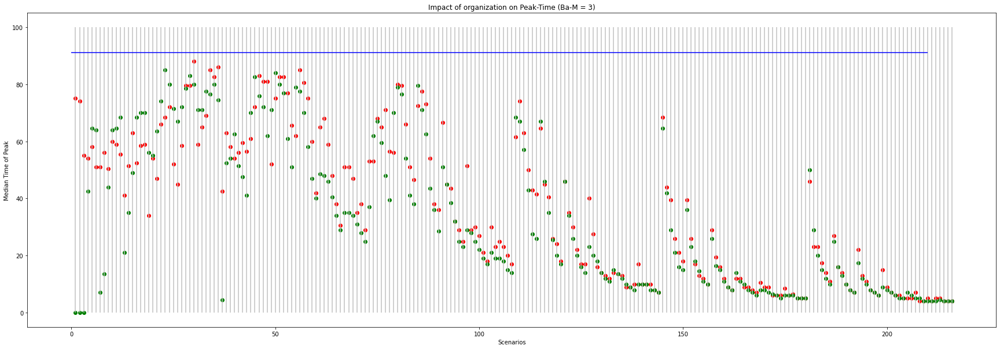

In [8]:
#could we look at the distribution- hist plots of time? or something else? CDF curves?
#need comparisons

#let's do a cum graph:
#cool so above works- now lets try to make a summary plot because this is really difficult
import statistics
sweep_infl = pd.read_csv("influence_mod_with_metrics.csv")
sweep_org = pd.read_csv("org_mod_with_metrics.csv")


g_data=pd.read_csv("google-trends.csv")
g_data.columns=['week', 'data']
goog_data= g_data['data'].to_list()

time_list=[]
for i in range(0, 114):
    time_list.append(i)

ba_m_list= [3,10]
p_list= [0.01, 0.05, 0.1, 0.25, 0.5, 0.75]
cit_cit_list= [0.01, 0.05, 0.1, 0.25, 0.5, 0.75]
cit_media_list = [0.01, 0.05, 0.1, 0.25, 0.5, 0.75]
org_cap_list = [1, 5]
org_strat_list= ['neighbors-of-neighbors', 'high-degree-citizens', 'high-degree-media', 'high-degree-cit-and-media']

difference_list=[]
infl_med_list_1=[]
org_med_list_1=[]
infl_total_list = []
org_total_list=[]

plt.figure(figsize=(30,10))
i = 0
for j in range(0, len(p_list)):
#for j in range(0, 3):
    sweep_p_infl = sweep_infl.loc[sweep_infl['simple-spread-chance'] == p_list[j]]
    sweep_p_org = sweep_org.loc[sweep_org['simple-spread-chance'] == p_list[j]]
    for h in range(0, len(cit_cit_list)):
    #for h in range(0, 3):
        sweep_c_c_infl = sweep_p_infl.loc[sweep_p_infl["citizen-citizen-influence"] == cit_cit_list[h]]
        sweep_c_c_org = sweep_p_org.loc[sweep_p_org["citizen-citizen-influence"] == cit_cit_list[h]]
        for k in range(0, len(cit_media_list)):
        #for k in range(0, 3):
            sweep_c_m_infl = sweep_c_c_infl.loc[sweep_c_c_infl["citizen-media-influence"] == cit_media_list[k]]
            sweep_c_m_org = sweep_c_c_org.loc[sweep_c_c_org["citizen-media-influence"] == cit_media_list[k]]
            #for l in range(0, len(ba_m_list)):
            for l in range(0, 1):
                sweep_m_infl = sweep_c_m_infl.loc[sweep_c_m_infl['ba-m'] == ba_m_list[l]]
                sweep_m_org = sweep_c_m_org.loc[sweep_c_m_org['ba-m'] == ba_m_list[l]]
                infl_peak_time_list = []
                org_peak_time_list=[]
            #print(len(ba_3_runs))
            #print(len(ba_10_runs))
            #median peak time with range of 25% to 75% of median
                for a in range(0, len(sweep_m_infl)):  
                    peak_time = sweep_m_infl['peak-time'].iloc[a]
                    infl_peak_time_list.append(peak_time)
                    infl_total_list.append(peak_time)
                for b in range(0, len(sweep_m_org)):  
                    peak_time = sweep_m_org['peak-time'].iloc[b]
                    org_peak_time_list.append(peak_time)
                    org_total_list.append(peak_time)
                infl_med = statistics.median(infl_peak_time_list)
                infl_med_list_1.append(infl_med)
                org_med = statistics.median(org_peak_time_list)
                org_med_list_1.append(org_med)
                difference = org_med - infl_med
                difference_list.append(difference)
                i = i + 1
            
            #plt.plot([i,i], [ba_3_med, ba_10_med])
                plt.scatter(i, infl_med, c = 'red')
                plt.scatter(i, org_med, c = 'green')
            
                plt.vlines(i, 0, 100, color = 'silver')
plt.hlines(91,0, 210, color = 'blue')
            
plt.title("Impact of organization on Peak-Time (Ba-M = 3)")
plt.ylabel('Median Time of Peak')
plt.xlabel('Scenarios')
#plt.savefig("ba-m_scenario.png")
plt.show()




[  0   0   0 ... 113 113 113]


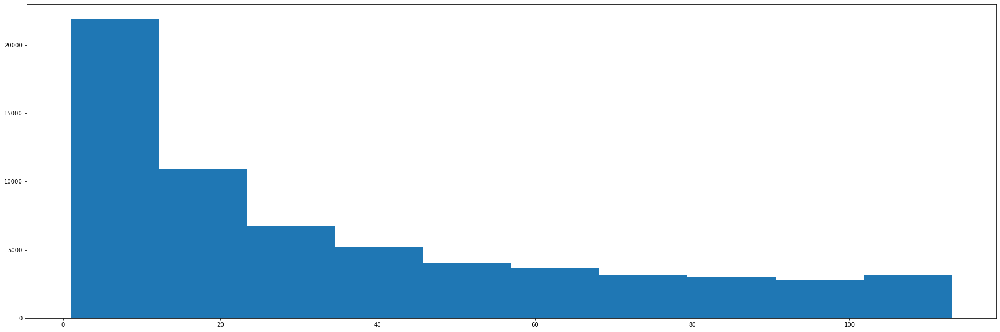

[0.00000000e+00 7.72141147e-05 1.54428229e-04 ... 9.99845572e-01
 9.99922786e-01 1.00000000e+00]
[  0   0   0 ... 113 113 113]


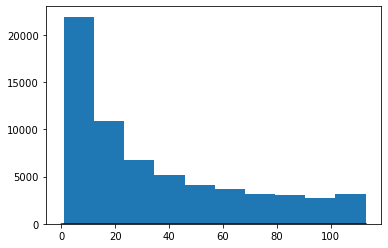

[0.00000000e+00 7.72141147e-05 1.54428229e-04 ... 9.99845572e-01
 9.99922786e-01 1.00000000e+00]
[  0   0   0 ... 113 113 113]


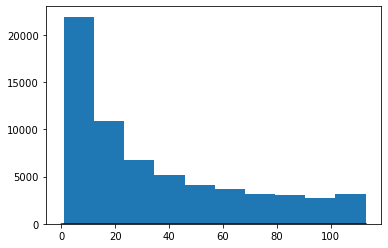

[0.00000000e+00 7.71962328e-05 1.54392466e-04 ... 9.99845608e-01
 9.99922804e-01 1.00000000e+00]
[  0   0   0 ... 113 113 113]


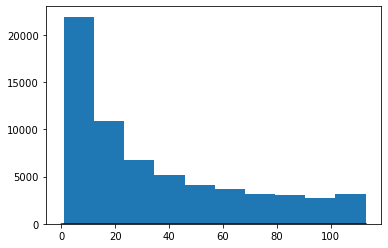

[0.00000000e+00 7.71783592e-05 1.54356718e-04 ... 9.99845643e-01
 9.99922822e-01 1.00000000e+00]
[  0   0   0 ... 113 113 113]


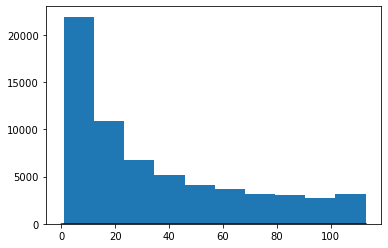

[0.00000000e+00 7.72081532e-05 1.54416306e-04 ... 9.99845584e-01
 9.99922792e-01 1.00000000e+00]
[  0   0   0 ... 113 113 113]


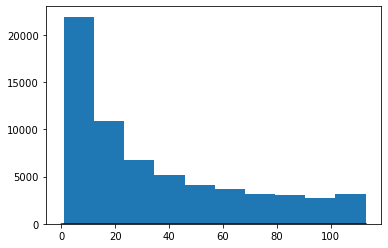

[0.00000000e+00 7.72141147e-05 1.54428229e-04 ... 9.99845572e-01
 9.99922786e-01 1.00000000e+00]
[  0   0   0 ... 113 113 113]


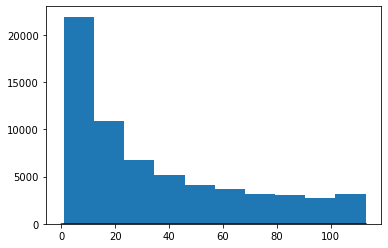

[0.00000000e+00 7.71962328e-05 1.54392466e-04 ... 9.99845608e-01
 9.99922804e-01 1.00000000e+00]
[  0   0   0 ... 113 113 113]


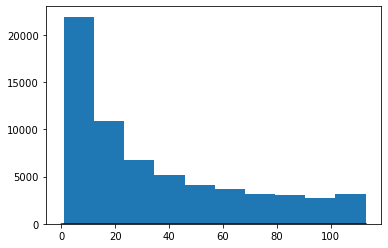

[0.00000000e+00 7.71843161e-05 1.54368632e-04 ... 9.99845631e-01
 9.99922816e-01 1.00000000e+00]


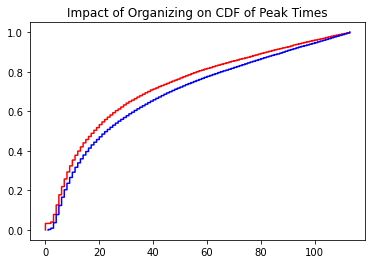

In [8]:
#could we look at the distribution- hist plots of time? or something else? CDF curves?
#need comparisons

#let's do a cum graph:
#cool so above works- now lets try to make a summary plot because this is really difficult
import statistics
sweep_infl = pd.read_csv("influence_mod_with_metrics.csv")
sweep_org = pd.read_csv("org_mod_with_metrics.csv")


g_data=pd.read_csv("google-trends.csv")
g_data.columns=['week', 'data']
goog_data= g_data['data'].to_list()

time_list=[]
for i in range(0, 114):
    time_list.append(i)

ba_m_list= [3,10]
p_list= [0.01, 0.05, 0.1, 0.25, 0.5, 0.75]
cit_cit_list= [0.01, 0.05, 0.1, 0.25, 0.5, 0.75]
cit_media_list = [0.01, 0.05, 0.1, 0.25, 0.5, 0.75]
org_cap_list = [1, 5]
org_strat_list= ['neighbors-of-neighbors', 'high-degree-citizens', 'high-degree-media', 'high-degree-cit-and-media']

difference_list=[]
infl_med_list_1=[]
org_med_list_1=[]
infl_total_list = []
org_total_list=[]

plt.figure(figsize=(30,10))
i = 0
for j in range(0, len(org_cap_list)):
    sweep_org_cap=sweep_org.loc[sweep_org['organizing-capacity'] == org_cap_list[j]]
    for h in range(0, len(org_strat_list)):
        sweep_org_strat= sweep_org_cap.loc[sweep_org_cap['flint-organizing-strategy'] == org_strat_list[h]]
        infl_peak_time_list = []
        org_peak_time_list=[]
        for a in range(0, len(sweep_infl)):  
            peak_time = sweep_infl['peak-time'].iloc[a]
            infl_peak_time_list.append(peak_time)
            infl_total_list.append(peak_time)
        for b in range(0, len(sweep_org_strat)):  
            peak_time = sweep_org_strat['peak-time'].iloc[b]
            org_peak_time_list.append(peak_time)
            org_total_list.append(peak_time)
        infl_med = statistics.median(infl_peak_time_list)
        infl_med_list_1.append(infl_med)
        org_med = statistics.median(org_peak_time_list)
        org_med_list_1.append(org_med)
        difference = org_med - infl_med
        difference_list.append(difference)
        i = i + 1
        
        sorted_org_data = np.sort(org_peak_time_list)
        #sorted_org_data=np.log(sorted_org_data)
        print(sorted_org_data)
        sorted_infl_data = np.sort(infl_peak_time_list)
        #sorted_infl_data = np.log(sorted_infl_data)
        plt.hist(sorted_infl_data)
        plt.show()
        #sort_data_no_0=[]
        #for i in range(0, len(sorted_infl_data)):
        #    if sorted_infl_data[i] > 0:
        #        sort_data_no_0.append(sorted_infl_data[i])
        #plt.hist(sort_data_no_0, bins = 20)
        #plt.show()
        p_org = 1. * np.arange(len(sorted_org_data))/ (len(sorted_org_data)-1)
        print(p_org)
        p_infl = 1. * np.arange(len(sorted_infl_data))/ (len(sorted_infl_data)-1)
        plt.plot(sorted_org_data, p_org, color = 'red')
        plt.plot(sorted_infl_data, p_infl, color = 'blue')
plt.title("Impact of Organizing on CDF of Peak Times")               
plt.show()
        
        
        
        
    
    
    
    
    


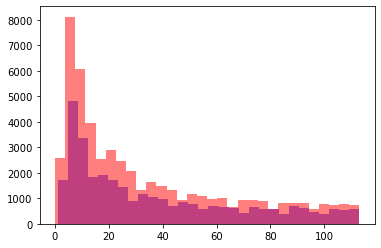

In [9]:
plt.hist(infl_total_list, color = 'blue', alpha = 0.5, bins = 30)
plt.hist(org_total_list, color = 'red', alpha = 0.5, bins = 30)
plt.show()

In [ ]:
## let'see if we can plot these

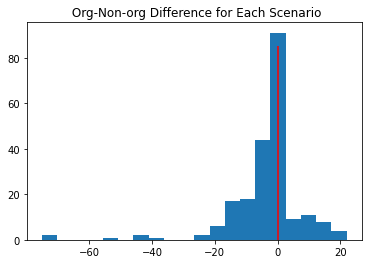

In [47]:
plt.hist(difference_list, bins = 20)
plt.title(" Org-Non-org Difference for Each Scenario")
plt.vlines(0, 0, 85, color = 'red')
plt.savefig('ba-m_diff.png')
plt.show()

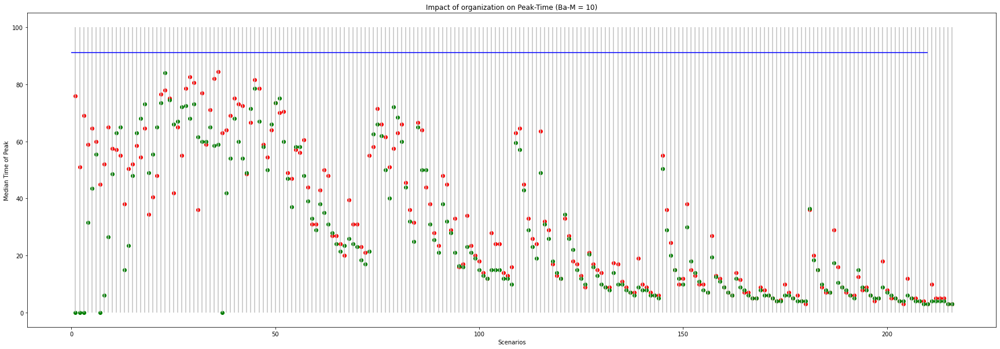

In [55]:
import statistics
sweep_infl = pd.read_csv("influence_mod_with_metrics.csv")
sweep_org = pd.read_csv("org_mod_with_metrics.csv")


g_data=pd.read_csv("google-trends.csv")
g_data.columns=['week', 'data']
goog_data= g_data['data'].to_list()

time_list=[]
for i in range(0, 114):
    time_list.append(i)

ba_m_list= [3,10]
p_list= [0.01, 0.05, 0.1, 0.25, 0.5, 0.75]
cit_cit_list= [0.01, 0.05, 0.1, 0.25, 0.5, 0.75]
cit_media_list = [0.01, 0.05, 0.1, 0.25, 0.5, 0.75]

difference_list=[]
infl_med_list_2=[]
org_med_list_2 = []

plt.figure(figsize=(30,10))
i = 0
for j in range(0, len(p_list)):
#for j in range(0, 3):
    sweep_p_infl = sweep_infl.loc[sweep_infl['simple-spread-chance'] == p_list[j]]
    sweep_p_org = sweep_org.loc[sweep_org['simple-spread-chance'] == p_list[j]]
    for h in range(0, len(cit_cit_list)):
    #for h in range(0, 3):
        sweep_c_c_infl = sweep_p_infl.loc[sweep_p_infl["citizen-citizen-influence"] == cit_cit_list[h]]
        sweep_c_c_org = sweep_p_org.loc[sweep_p_org["citizen-citizen-influence"] == cit_cit_list[h]]
        for k in range(0, len(cit_media_list)):
        #for k in range(0, 3):
            sweep_c_m_infl = sweep_c_c_infl.loc[sweep_c_c_infl["citizen-media-influence"] == cit_media_list[k]]
            sweep_c_m_org = sweep_c_c_org.loc[sweep_c_c_org["citizen-media-influence"] == cit_media_list[k]]
            #for l in range(0, len(ba_m_list)):
            for l in range(1, 2):
                sweep_m_infl = sweep_c_m_infl.loc[sweep_c_m_infl['ba-m'] == ba_m_list[l]]
                sweep_m_org = sweep_c_m_org.loc[sweep_c_m_org['ba-m'] == ba_m_list[l]]
                infl_peak_time_list = []
                org_peak_time_list=[]
            #print(len(ba_3_runs))
            #print(len(ba_10_runs))
            #median peak time with range of 25% to 75% of median
                for a in range(0, len(sweep_m_infl)):  
                    peak_time = sweep_m_infl['peak-time'].iloc[a]
                    infl_peak_time_list.append(peak_time)
                for b in range(0, len(sweep_m_org)):  
                    peak_time = sweep_m_org['peak-time'].iloc[b]
                    org_peak_time_list.append(peak_time)
                infl_med = statistics.median(infl_peak_time_list)
                infl_med_list_2.append(infl_med)
                org_med = statistics.median(org_peak_time_list)
                org_med_list_2.append(org_med)
                difference = org_med - infl_med
                difference_list.append(difference)
                i = i + 1
            
            #plt.plot([i,i], [ba_3_med, ba_10_med])
                plt.scatter(i, infl_med, c = 'red')
                plt.scatter(i, org_med, c = 'green')
            
                plt.vlines(i, 0, 100, color = 'silver')
plt.hlines(91,0, 210, color = 'blue')
            
plt.title("Impact of organization on Peak-Time (Ba-M = 10)")
plt.ylabel('Median Time of Peak')
plt.xlabel('Scenarios')
#plt.savefig("ba-m_scenario.png")
plt.show()




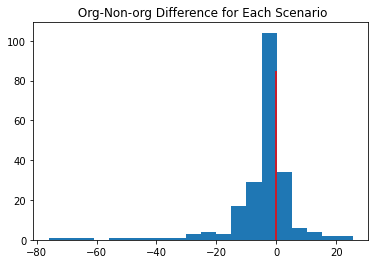

In [50]:
plt.hist(difference_list, bins = 20)
plt.title(" Org-Non-org Difference for Each Scenario")
plt.vlines(0, 0, 85, color = 'red')
plt.savefig('ba-m_diff.png')
plt.show()

Text(0.5, 0, 'Scenario')

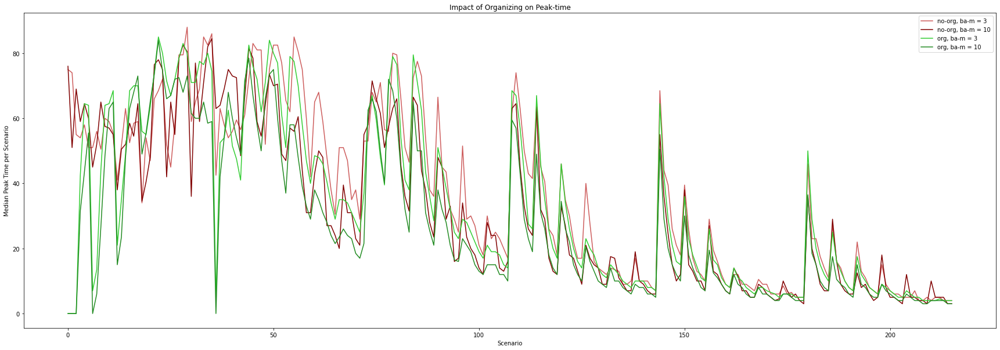

In [58]:
plt.figure(figsize=(30,10))
time_list=[]
for i in range(0, len(infl_med_list_1)):
    time= i
    time_list.append(time)
plt.plot(time_list, infl_med_list_1, color = 'indianred', label = 'no-org, ba-m = 3')
time_list=[]
for i in range(0, len(infl_med_list_2)):
    time= i
    time_list.append(time)
plt.plot(time_list, infl_med_list_2, color = 'maroon', label = 'no-org, ba-m = 10')
time_list=[]
for i in range(0, len(org_med_list_1)):
    time= i
    time_list.append(time)
plt.plot(time_list, org_med_list_1, color = 'limegreen', label = 'org, ba-m = 3')
time_list=[]
for i in range(0, len(org_med_list_2)):
    time= i
    time_list.append(time)
plt.plot(time_list, org_med_list_2, color = 'forestgreen', label = 'org, ba-m = 10')
plt.legend()
plt.title("Impact of Organizing on Peak-time")
plt.ylabel("Median Peak Time per Scenario")
plt.xlabel("Scenario")

In [ ]:
#lets look closely at some of the interesting organizing runs

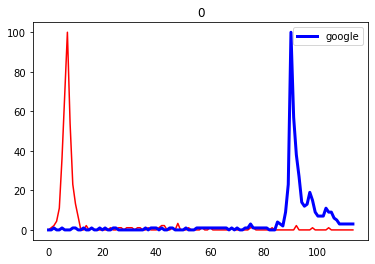

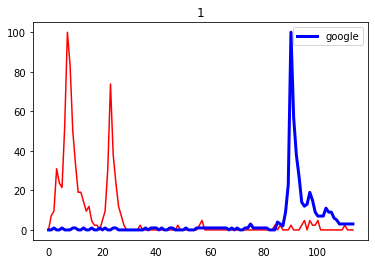

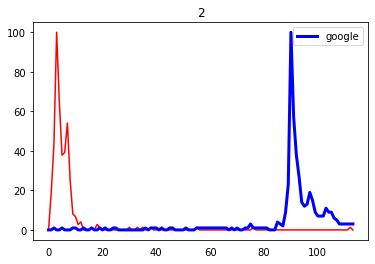

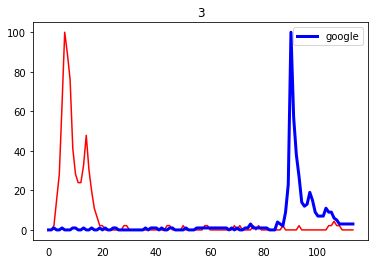

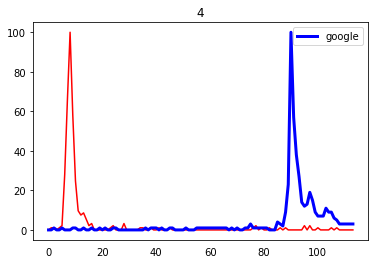

...

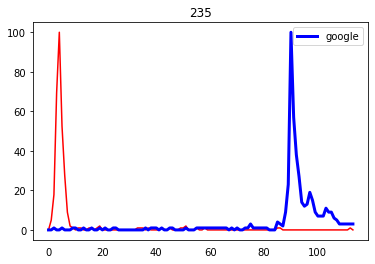

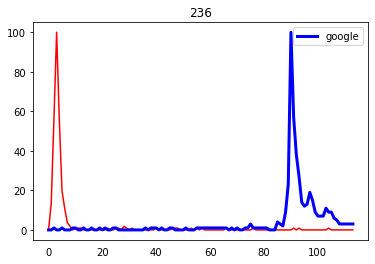

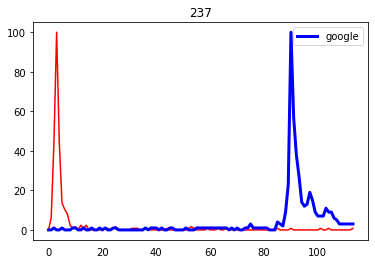

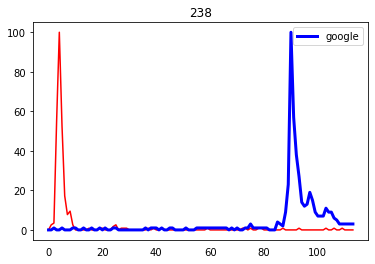

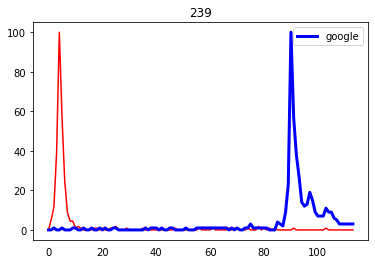

In [59]:
# run 305
df=pd.read_csv("org_mod_with_metrics.csv")
g_data=pd.read_csv("google-trends.csv")
g_data.columns=['week', 'data']
goog_data= g_data['data'].to_list()

time_list=[]
for i in range(0, 114):
    time_list.append(i)
data_1= df.loc[df['ba-m']==10]
data_1=data_1.loc[data_1['simple-spread-chance']==0.75]
data_1=data_1.loc[data_1['citizen-citizen-influence']==0.75]
data_1=data_1.loc[data_1['citizen-media-influence']==0.01]

for i in range(0, len(data_1)):
    data=data_1['short list'].iloc[i]
    data_list=data.strip('][').split(', ')
    new_list=[]
    for j in range(0, len(data_list)):
        item=float(data_list[j])
        new_list.append(item)
    val=i
    plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False)
    plt.plot(time_list, new_list, color='red')
    plt.plot(time_list, goog_data, color='blue', lw=3, label="google")
    plt.legend()
    plt.title(i)
    plt.show()
    
    
    #no hits- not surprising since organizing should make the peak occur earlier

# Here, we will make a figure displaying how a different kind of crisis may be better represented by our model

In [11]:
df_multi_crisis= pd.read_csv("comparison_water_crisis.csv")
print(df_multi_crisis)

     Weeks-from-start  Flint  East Palestine  Philadelphia
0                   1      0             3.0         100.0
1                   2      0            23.0           6.0
2                   3      1           100.0           5.0
3                   4      0            37.0           4.0
4                   5      0            15.0           4.0
..                ...    ...             ...           ...
109               110      3             NaN           NaN
110               111      3             NaN           NaN
111               112      3             NaN           NaN
112               113      3             NaN           NaN
113               114      3             NaN           NaN

[114 rows x 4 columns]


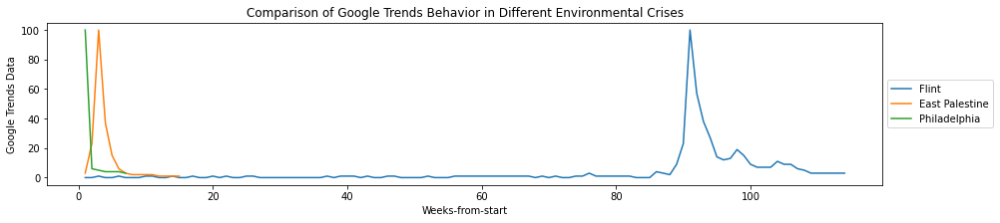

In [28]:
plt.figure(figsize=(15, 3))
sns.color_palette("colorblind")
sns.lineplot(data=df_multi_crisis, x='Weeks-from-start', y='Flint', label = 'Flint')
sns.lineplot(data=df_multi_crisis, x='Weeks-from-start', y='East Palestine', label = 'East Palestine')
sns.lineplot(data=df_multi_crisis, x='Weeks-from-start', y='Philadelphia', label = 'Philadelphia')
plt.ylabel("Google Trends Data")
plt.title ("Comparison of Google Trends Behavior in Different Environmental Crises")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.savefig('comparison_crises.png')
plt.show()



# Analysis of base-case model

In [29]:
base_mod = pd.read_csv('results-base-model-.csv')
base_mod.columns = ['run', 'n', 'spread-type', 'simple-spread-chance', 'graph-type', 'ba-m', 'citizen-citizen-influence',
                  'citizen-media-influence','repetition', 'data', 'num_media']

In [32]:
#process the csv and add columns to fill with metrics later

#short list represents both the shortened list to match the google trends data (114 weeks) and the processed data so that it
#is scaled out of 100 to better align with google data
base_mod["short list"]=None
base_mod['unscaled-list']=None
#threshold is a binary value representing whether or not the critical mass of the population has been reached (represented by
# 70%)
base_mod['threshold'] = None
#peak-time is the time at which the peak will occur
base_mod['peak-time']=None
#total spread is how many agents were reached in sum 
base_mod['total-spread']=None

#total-error is the total error
base_mod['total-error']=None
#r is caluclated as pearson's r
base_mod['r']= None


'''The three functions below are needed for data processing'''

def convertdata(data):
    sdata = data.strip(' ')
    ndata = nlogo_parse_chunk(sdata)
    n2data = [elem.replace('.', '') for elem in ndata]
    list=[]
    for x in n2data:
        list.append(x.replace("\r\n", ""))
    list = [i for i in list if i]
    return list

def nlogo_parse_chunk(chunk):
    chunk = chunk.strip().replace('"','')
    if chunk.count('[') > 1 and chunk[0] == '[':
        return nlogo_mixed_list_to_dict_rec(chunk[chunk.index('['):].strip())
    elif chunk.count('[') > 1 or chunk[0] != '[':
        return { chunk[0:chunk.index('[')].strip(): nlogo_mixed_list_to_dict_rec(chunk[chunk.index('['):].strip()) }

    pieces = chunk.strip().replace('[','').replace(']','').split(' ')
    if len(pieces) == 2:
        return { pieces[0]: pieces[1] }
    else:
        return pieces

def convert_to_int(data):
    for i in range(0, len(data)):
        data[i] = int(data[i])
    return data



'''This section goes through each simulation to update the dataframe with usable data and the metrics set up above'''
for i in range(0,base_mod.shape[0]):
    thresh=0
    error=0

    
    #set cutoff to the number of agents that need to hear about Flint to be considered a success- for this model, total runs are 
    #500 agents, so 350 represents 70% of them
    cutoff= (300 + int(base_mod['num_media'].iloc[i])) * 0.7
    
    run1 =  base_mod["data"].iloc[i]
    finallist = convertdata(run1)
    int_data = convert_to_int(finallist)
    short_list=int_data[: 114]
    base_mod['unscaled-list'].iloc[i] = short_list
    scaled_short_list=[]
        #code below scales data from 0-100 to match google trends- this is needed to calculate total error, pearson's r, etc
    if max(short_list)>= 1:
        for k in range(0, len(short_list)):
            val=(short_list[k]/max(short_list))*100
            scaled_short_list.append(val)
        time_of_peak=short_list.index(max(short_list))
    else:
        time_of_peak = 0
        for k in range(0, len(short_list)):
            val = (short_list[k] / 1) * 100
            scaled_short_list.append(val)
    base_mod['short list'].iloc[i] = scaled_short_list
    for h in range(0, len(scaled_short_list)):
        thresh=thresh+int_data[h]
        error_addition=abs(scaled_short_list[h]-google_data[h])
        error=error+error_addition
    #since thresh is untransformed, we tabulate off of raw data cut to 114 weeks, not the scaled 0-100 data
    base_mod['total-spread'].iloc[i] = thresh
    if thresh >= cutoff:
        base_mod['threshold'].iloc[i] = 1
    else:
        base_mod['threshold'].iloc[i] = 0
  

    base_mod["total-error"].iloc[i]=error
    base_mod['peak-time'].iloc[i]=time_of_peak

        #2-week spread
        
    if i % 5000 == 0:
        print(i)



0
5000


In [33]:
base_mod.to_csv("base_mod_with_metrics.csv")

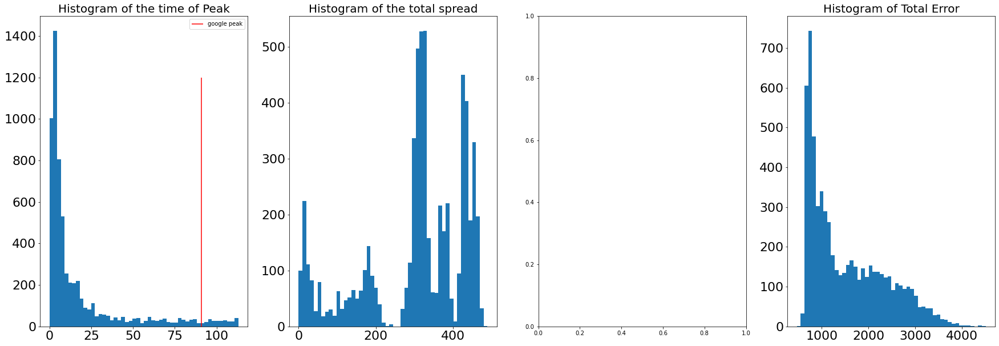

In [34]:
'''WHAT ARE THE RANGES OF EACH OF OUR METRICS?'''
#Note: this analysis uses all simulations, not limited to those that crossed the threshold. Because of this, there bin for peak
#spread = 100 is inflated, because this includes runs that went something like [0,0,0,0,1,0,0,0]

base_mod = pd.read_csv('base_mod_with_metrics.csv')

figure, axis = plt.subplots(1, 4, figsize= (30,10))

# For peak time
axis[0].hist(base_mod['peak-time'], bins=50)
axis[0].vlines(91, 0, 1200, color = 'red', label = 'google peak')
axis[0].set_title("Histogram of the time of Peak", size=20)
axis[0].legend()
axis[0].tick_params(axis='both', which='major', labelsize=22)
  
# For total-spread
axis[1].hist(base_mod['total-spread'], bins=50)
axis[1].set_title("Histogram of the total spread", size=20)
axis[1].tick_params(axis='both', which='major', labelsize=22)


# For total error
axis[3].hist(base_mod['total-error'], bins=50)
axis[3].set_title("Histogram of Total Error", size=20)
axis[3].tick_params(axis='both', which='major', labelsize=22)
  
# Combine all the operations and display
plt.show()



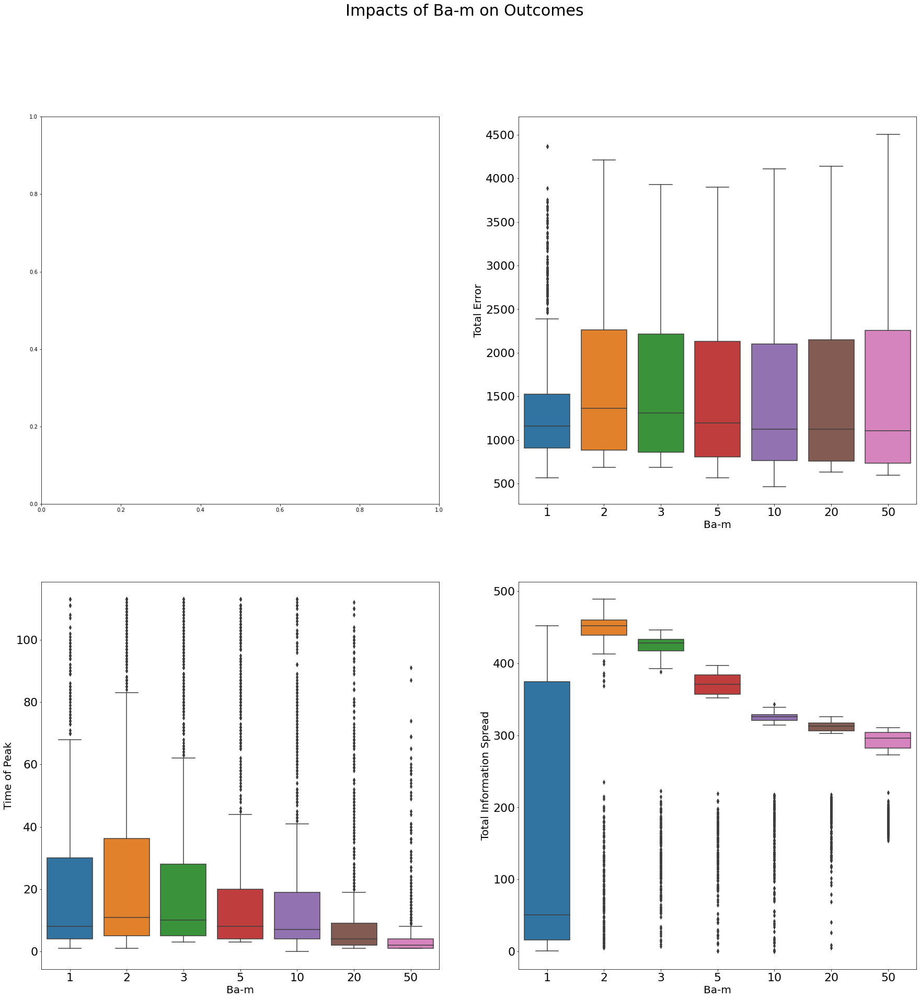

In [35]:
    
fig, axes=plt.subplots(2,2, figsize= (30,30))
fig.suptitle('Impacts of Ba-m on Outcomes', fontsize=30)


sns.boxplot(ax=axes[0,1], data= base_mod, x='ba-m', y='total-error')
axes[0,1].set_xlabel("Ba-m", fontsize=20)
axes[0,1].set_ylabel("Total Error", fontsize=20)
axes[0,1].tick_params(axis='both', which='major', labelsize=22)


sns.boxplot(ax=axes[1,0], data= base_mod, x='ba-m', y='peak-time')
axes[1,0].set_xlabel("Ba-m", fontsize=20)
axes[1,0].set_ylabel("Time of Peak", fontsize=20)
axes[1,0].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[1,1], data= base_mod, x='ba-m', y='total-spread')
axes[1,1].set_xlabel("Ba-m", fontsize=20)
axes[1,1].set_ylabel("Total Information Spread", fontsize=20)
axes[1,1].tick_params(axis='both', which='major', labelsize=22)



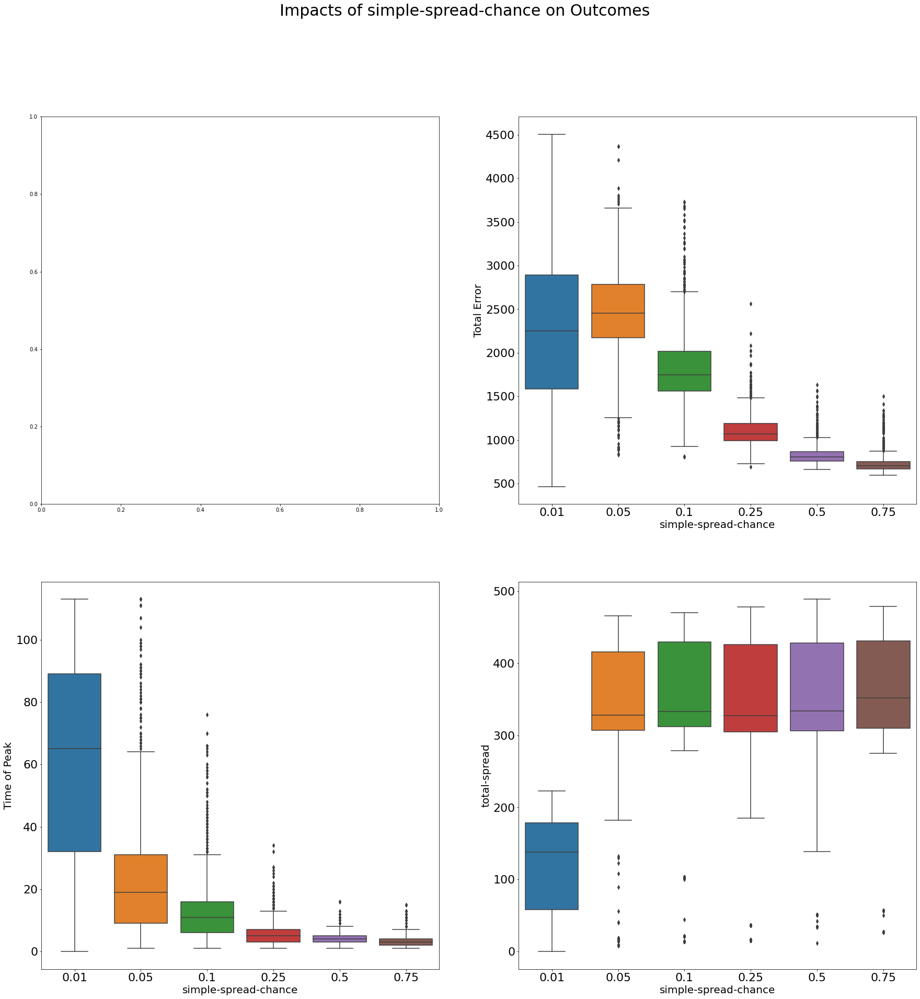

In [37]:
fig, axes=plt.subplots(2,2, figsize= (30,30))
fig.suptitle('Impacts of simple-spread-chance on Outcomes', fontsize=30)


sns.boxplot(ax=axes[0,1], data= base_mod, x='simple-spread-chance', y='total-error')
axes[0,1].set_xlabel("simple-spread-chance", fontsize=20)
axes[0,1].set_ylabel("Total Error", fontsize=20)
axes[0,1].tick_params(axis='both', which='major', labelsize=22)



sns.boxplot(ax=axes[1,0], data= base_mod, x='simple-spread-chance', y='peak-time')
axes[1,0].set_xlabel("simple-spread-chance", fontsize=20)
axes[1,0].set_ylabel("Time of Peak", fontsize=20)
axes[1,0].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[1,1], data= base_mod, x='simple-spread-chance', y='total-spread')
axes[1,1].set_xlabel("simple-spread-chance", fontsize=20)
axes[1,1].set_ylabel("total-spread", fontsize=20)
axes[1,1].tick_params(axis='both', which='major', labelsize=22)

    ba-m  simple-spread-chance  threshold
0      1                  0.01          0
1      1                  0.05         35
2      1                  0.10         62
3      1                  0.25         31
4      1                  0.50         30
5      1                  0.75         89
6      2                  0.01          0
7      2                  0.05        149
8      2                  0.10        150
9      2                  0.25        150
10     2                  0.50        150
11     2                  0.75        150
12     3                  0.01          0
13     3                  0.05        150
14     3                  0.10        150
15     3                  0.25        150
16     3                  0.50        150
17     3                  0.75        150
18     5                  0.01          0
19     5                  0.05        150
20     5                  0.10        150
21     5                  0.25        150
22     5                  0.50    

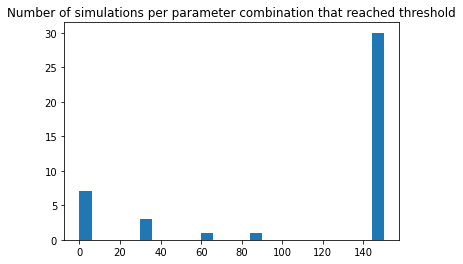

In [40]:
base_mod_thresh_count=base_mod.copy()
base_mod_thresh_count=base_mod_thresh_count.groupby(["ba-m", 'simple-spread-chance'])['threshold'].sum().reset_index()
print(base_mod_thresh_count)

base_mod_thresh_count.to_csv("base_mod_thresh_count.csv")

plt.hist(base_mod_thresh_count["threshold"], bins=25)
plt.title('Number of simulations per parameter combination that reached threshold')
plt.show()


    ba-m  simple-spread-chance  peak-time
0      1                  0.01       34.5
1      1                  0.05       26.0
2      1                  0.10       27.5
3      1                  0.25        7.0
4      1                  0.50        4.0
5      1                  0.75        5.0
6      2                  0.01       87.0
7      2                  0.05       41.0
8      2                  0.10       16.5
9      2                  0.25        8.0
10     2                  0.50        5.0
11     2                  0.75        4.0
12     3                  0.01       86.0
13     3                  0.05       29.0
14     3                  0.10       15.0
15     3                  0.25        7.0
16     3                  0.50        4.0
17     3                  0.75        4.0
18     5                  0.01       84.0
19     5                  0.05       20.0
20     5                  0.10       12.0
21     5                  0.25        6.0
22     5                  0.50    

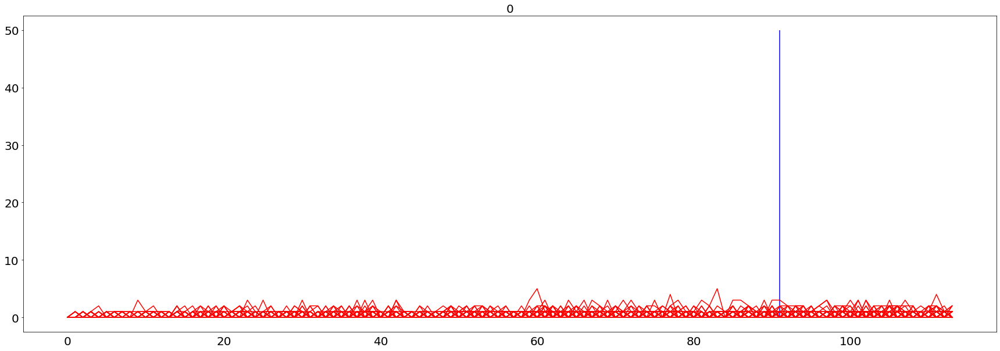

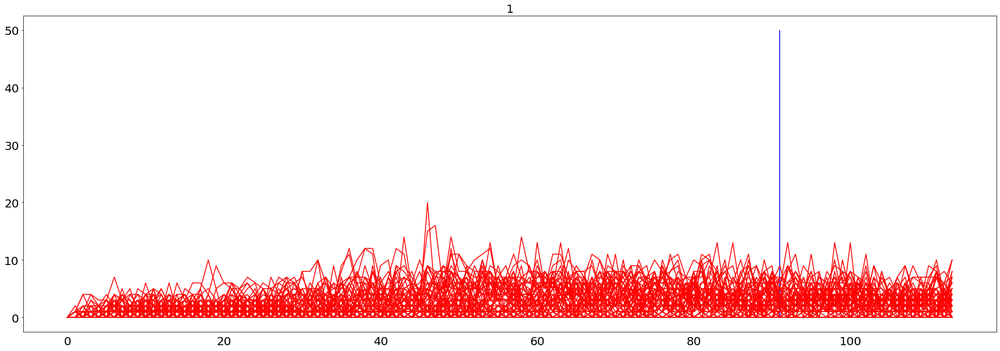

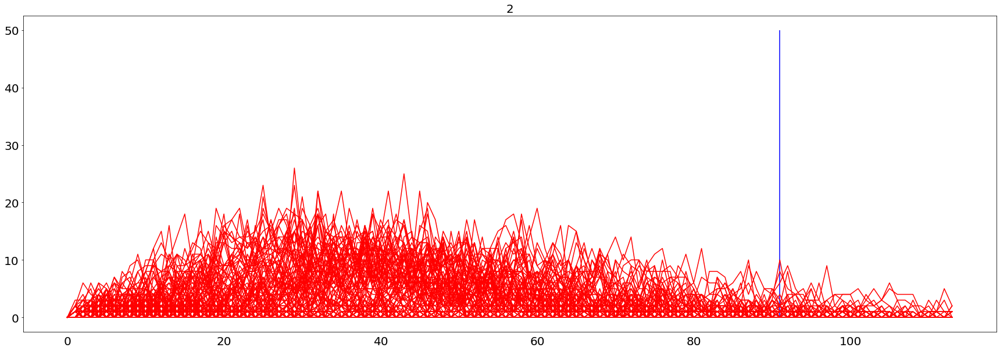

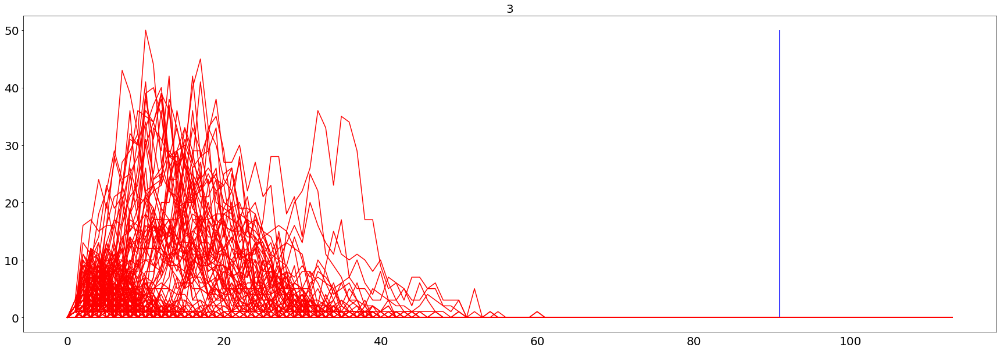

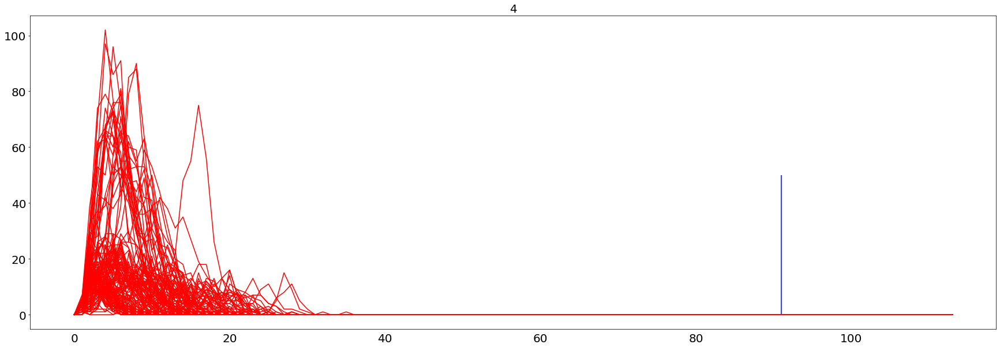

...

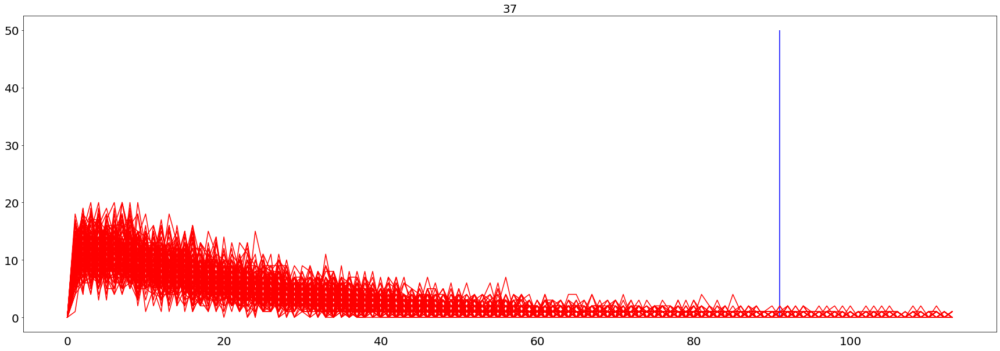

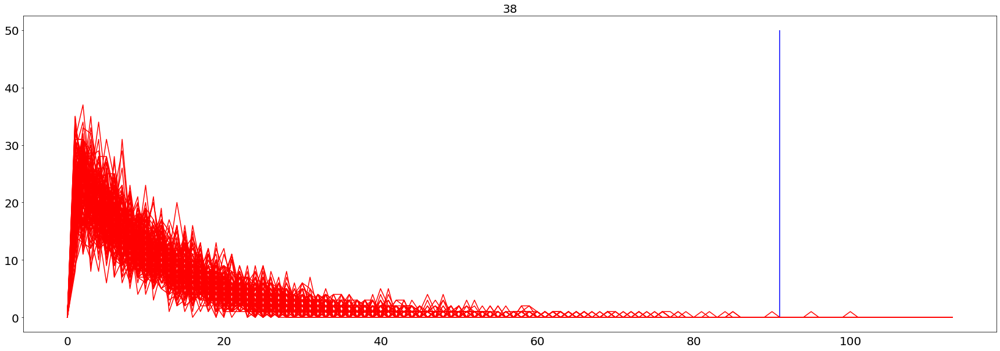

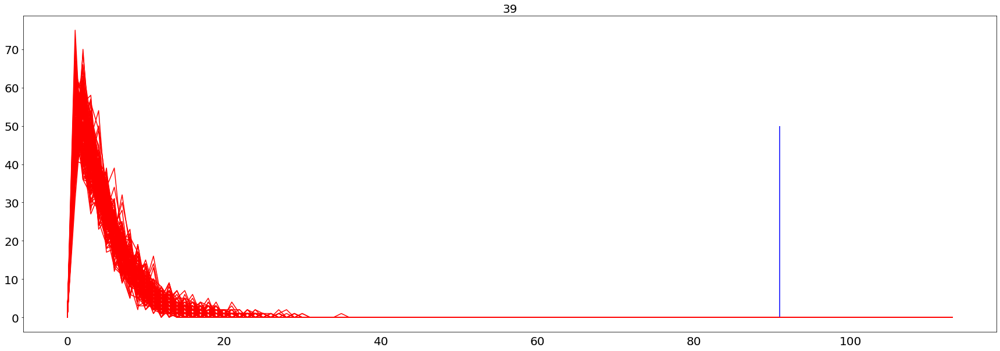

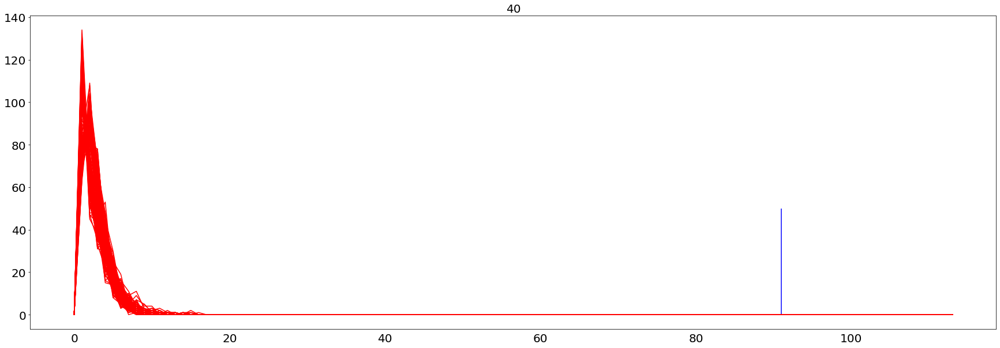

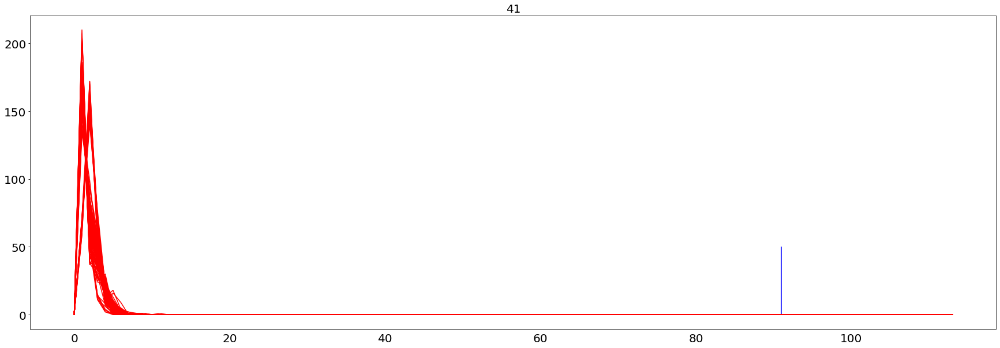

In [46]:
base_mod_thresh_count=base_mod.copy()
base_mod_time_count=base_mod_thresh_count.groupby(["ba-m", 'simple-spread-chance'])['peak-time'].median().reset_index()
print(base_mod_time_count)


df=pd.read_csv("base_mod_with_metrics.csv")
#old method for this

g_data=pd.read_csv("google-trends.csv")
g_data.columns=['week', 'data']
goog_data= g_data['data'].to_list()

time_list=[]
for i in range(0, 114):
    time_list.append(i)
#infl_mod_thresh_count=infl_mod_thresh_count.loc[infl_mod_thresh_count['threshold']>=20]

base_mod_time_median= base_mod_time_count
for i in range(0, len(base_mod_time_median)):
    ba_m_val = base_mod_time_median['ba-m'].iloc[i]
    p_ = base_mod_time_median['simple-spread-chance'].iloc[i]
    data_1= df.loc[df['ba-m']==ba_m_val]
    data_1=data_1.loc[data_1['simple-spread-chance']==p_]
    plt.figure(figsize=(30,10))
    for j in range(0, len(data_1)):
        data=data_1['unscaled-list'].iloc[j]
        data_list=data.strip('][').split(', ')
        new_list=[]
        for j in range(0, len(data_list)):
            item=float(data_list[j])
            new_list.append(item)
        val=i
        
        plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False, labelsize=20)
        plt.plot(time_list, new_list, color='red')
    plt.vlines(91, 0, 50, color = 'blue')

    plt.title(i, fontsize=20)
    plt.show()

<AxesSubplot:xlabel='simple-spread-chance', ylabel='ba-m'>

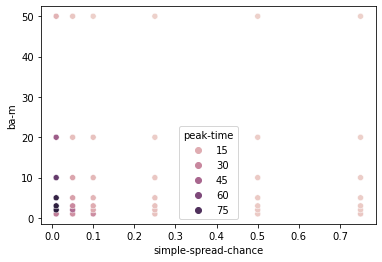

In [42]:
sns.scatterplot(data=base_mod_time_count, x='simple-spread-chance', y='ba-m', hue='peak-time')

<AxesSubplot:xlabel='simple-spread-chance', ylabel='ba-m'>

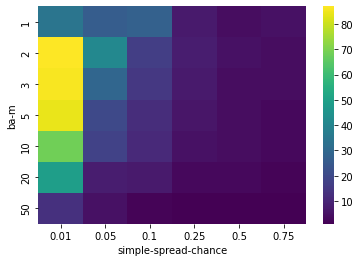

In [49]:
base_mod_time=base_mod_time_count.pivot("ba-m", 'simple-spread-chance', 'peak-time')
sns.heatmap(base_mod_time, cmap = 'viridis')